# Function Renaming
## Symbols Dataset

In this notebook  the symbols dataset is read and their graphs, topological features and code features are extracted into a new dataset. Finally some baseline models for classification are trained for testing these topological and the code features.

Proposed toc:
1. dataset extraction
2. dataset inspection and verification
3. Manual labelling (generate python dict with this information)
3. baseline topological models
4. baseline code feature models
5. baseline Bow TF-IDF model

##  1. Symbols dataset extraction

In [1]:
%load_ext autoreload
%autoreload 2

import importlib
import time
import pickle
import traceback
import random
import os
import re
import sys
import json
from pprint import pprint
import numpy as np
from numpy.random import choice
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

import torch
from torch_geometric.data import Dataset
from torch_geometric.data import Data
from torch_geometric.data import DataLoader

from TFM_function_renaming_dataset_creation import *
from TFM_function_renaming_dataset_creation import FunctionsDataset




In [2]:
dataset = FunctionsDataset(root='./tmp/symbols_dataset_2')
print(len(dataset))
print(dataset.num_classes)
print(dataset.num_features)

processed_path tmp/symbols_dataset_2/processed
30885
1
4


In [3]:
dir(dataset[0])

['__call__',
 '__class__',
 '__contains__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'apply',
 'cat_dim',
 'clone',
 'code_feats',
 'contains_isolated_nodes',
 'contains_self_loops',
 'contiguous',
 'edge_attr',
 'edge_index',
 'filename',
 'from_dict',
 'is_coalesced',
 'is_directed',
 'is_undirected',
 'keys',
 'num_edges',
 'num_features',
 'num_nodes',
 'pos',
 'to',
 'x',
 'x_topo_feats',
 'x_topo_times',
 'y']

In [4]:
for i in range(len(dataset)):
    pprint(dataset[0].x_topo_feats)
    
#dataset[0].x_topo_times


[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.000277280807

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.0319900512695

 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.000277280807

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.861022949218

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.000277280807

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.7751617431640

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.7751617431640

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570

 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.0001716613769

 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.8875808715820

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.861022949218

 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260

 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.0001716613769

 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.0319900512695

 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.000277280807

 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.7751617431640

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.000277280807

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.0001716613769

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.7751617431640

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.0001716613769

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.861022949218

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.861022949218

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.0319900512695

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.0319900512695

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.1048736572265

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.000277280807

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.222724914550781e-05,
 4.887580871582031e-05,
 9.775161743164062e-06,
 1.0728836059570312e-05,
 0.0002772808074951172,
 6.031990051269531e-05,
 7.104873657226562e-05,
 0.000171661376953125,
 0.00012540817260742188]
[2.86102294921875e-06,
 6.22272491455078

In [10]:
for i in range(len(dataset)):
    f = dataset[i].filename
    j = len('tmp/symbols_dataset_part1/raw/graphs01/unknown/')
    f = f[j:]
    k = f.find('/')
    l = f.find('_edges.txt')
    f2 = f[(k+1):l]
    f3 = f[:l]
    # remove _edges.txt 
    pprint(f3)
    

    

'filezilla_i64/_ZNK17CSplitterWindowEx17GetEventHashTableEv'
'libstdcpp_6_i64/_ZNSt17__timepunct_cacheIwED1Ev'
'openssl_i64/AES_set_decrypt_key'
'libsqlite3-0_i64/checkList'
'filezilla_i64/_ZNSt17_Function_handlerIFbwENSt8__detail15_BracketMatcherINSt7__cxx1112regex_traitsIwEELb0ELb0EEEE9_M_invokeERKSt9_Any_dataOw'
'openssl_i64/PEM_write_bio'
'openssl_i64/tree_add_auth_node'
'openssl_i64/___libc_start_main'
'filezilla_i64/_weak__ZN2fz7sprintfIIRKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEiEEES6_PKwDpOT___ZN19CNotificationHelperIL14NotificationId0EED1Ev'
'openssl_i64/asn1_const_Finish'
'libhogweed-4_i64/_nettle_cnd_swap'
'filezilla_i64/_ZN13CQueueStorage9GetServerER4Siteb'
'openssl_i64/DSA_verify'
'httpd_i64/ap_init_rng'
'httpd_i64/ap_varbuf_strmemcat'
'openssl_i64/gost_engine_init'
'filezilla_i64/_ZN6wxIconC1ERK8wxString12wxBitmapTypeii'
'filezilla_i64/_ZN18wxChoiceXmlHandlerC1Ev_0'
'libgmp-10_i64/__gmpz_fdiv_q'
'libgcc_s_seh-1_i64/__lttf2'
'libgnutls-30_i64/ecdsa_in_range_isr

'libsqlite3-0_i64/selectExpander'
'libgnutls-30_i64/gnutls_error_is_fatal'
'httpd_i64/ap_update_sb_handle'
'filezilla_i64/__tcf_2_36'
'libgnutls-30_i64/_gnutls_x509_generalTime2gtime'
'filezilla_i64/GetFileAttributesW'
'filezilla_i64/_ZThn800_N18CSpeedLimitsDialogD1Ev'
'filezilla_i64/_ZThn608_N12CIconPreviewD0Ev'
'libnettle-6_i64/nettle_camellia256_crypt'
'libstdcpp_6_i64/_ZNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEE10_M_disposeEv'
'filezilla_i64/_ZN2fz19replaced_substringsERKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEES7_S7_'
'openssl_i64/X509_CRL_set_issuer_name'
'libgmp-10_i64/__gmpn_mod_1_1p_cps_x86_64'
'libsqlite3-0_i64/hashDestroy'
'libstdcpp_6_i64/_ZNSt12__cow_stringD1Ev'
'libsqlite3-0_i64/sqlite3_vtab_on_conflict'
'openssl_i64/DSA_up_ref'
'filezilla_i64/_ZNK25CRecursiveOperationStatus13GetEventTableEv'
'libfilezilla-0_i64/_ZN2fz8datetimeC1ERK9_FILETIMENS0_8accuracyE'
'filezilla_i64/_weak__ZNSt5dequeIP9CFileItemSaIS1_EE17_M_push_front_auxIIRKS1_EEEvDpOT___ZN8wxTh

'filezilla_i64/_ZSt16__insertion_sortISt15_Deque_iteratorI11CServerPathRS1_PS1_EN9__gnu_cxx5__ops15_Iter_less_iterEEvT_S8_T0_'
'libstdcpp_6_i64/_ZNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEE5eraseEN9__gnu_cxx17__normal_iteratorIPcS4_EE'
'libgnutls-30_i64/gnutls_record_cork'
'libgmp-10_i64/__gmpn_hamdist'
'libgmp-10_i64/__gmpz_ui_kronecker'
'libstdcpp_6_i64/_ZNSt7__cxx1118basic_stringstreamIcSt11char_traitsIcESaIcEEC1ESt13_Ios_Openmode'
'openssl_i64/X509_check_email'
'libgnutls-30_i64/test_sig'
'nginx_i64/_getenv'
'filezilla_i64/_ZN20wxEventFunctorMethodI14wxEventTypeTagI12wxMouseEventE12wxEvtHandler7wxEventS3_EclEPS3_RS4_'
'libgnutls-30_i64/supported_versions_send_params'
'libgnutls-30_i64/_gnutls_strdatum_to_buf'
'libfzshellext-0_64_i64/atexit'
'httpd_i64/ap_is_rdirectory'
'libhogweed-4_i64/_nettle_ecc_add_ehh'
'libstdcpp_6_i64/_ZNSt10moneypunctIcLb0EEC1EPiPKcy'
'libfilezilla-0_i64/_ZNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEE10_M_replaceEyyPKwy'
'filezilla_i64/_ZN14CCo

'libsqlite3-0_i64/sqlite3Fts5ParseNode'
'filezilla_i64/_ZN10CMainFrame16OnOptionsChangedERKSt6bitsetILy192EE'
'libsqlite3-0_i64/pager_playback_one_page'
'filezilla_i64/_ZN10CMainFrame20OnFilterRightclickedER14wxCommandEvent'
'openssl_i64/X509_set_issuer_name'
'openssl_i64/b2i_PrivateKey_bio'
'libstdcpp_6_i64/__mingw_GetSectionCount'
'libsqlite3-0_i64/sqlite3VdbeMakeLabel_isra_561'
'filezilla_i64/_ZNK18CFilelistStatusBar13GetEventTableEv'
'libnettle-6_i64/nettle_gcm_aes_update'
'filezilla_i64/sub_5F8740'
'libstdcpp_6_i64/_ZN9__gnu_cxx8__detail13__mini_vectorISt4pairIPNS_16bitmap_allocatorIcE12_Alloc_blockES6_EEC1Ev'
'fzputtygen_i64/_exit'
'libstdcpp_6_i64/_ZNSt14basic_ofstreamIwSt11char_traitsIwEEC2EPKcSt13_Ios_Openmode'
'nginx_i64/ngx_http_parse_header_line'
'libstdcpp_6_i64/_ZNKSt13__facet_shims12_GLOBAL__N_113time_get_shimIwE13do_date_orderEv'
'libgnutls-30_i64/_asn1_set_value'
'filezilla_i64/_ZNSt8_Rb_treeI15capabilityNamesSt4pairIKS0_N13CCapabilities5t_capEESt10_Select1stIS5_ESt4le

'libsqlite3-0_i64/fts5SentenceFinderCb'
'filezilla_i64/_ZNSt8_Rb_treeIN2fz10public_keyESt4pairIKS1_NS0_11private_keyEESt10_Select1stIS5_ESt4lessIS1_ESaIS5_EE8_M_eraseEPSt13_Rb_tree_nodeIS5_E'
'filezilla_i64/_ZNK23COptionsPageUpdateCheck15GetResourceNameEv'
'libstdcpp_6_i64/_ZN9__gnu_cxx20recursive_init_errorD1Ev'
'openssl_i64/ENGINE_set_load_privkey_function'
'filezilla_i64/_Z11wxCheckCastI8wxWindowEPT_PKvS2__isra_38_constprop_146'
'filezilla_i64/_ZNK10wxListCtrl11MSWGetStyleElPm'
'libgnutls-30_i64/disable_crl_checks'
'libgcc_s_seh-1_i64/__gttf2'
'libstdcpp_6_i64/_ZN10__cxxabiv117__array_type_infoD0Ev'
'filezilla_i64/_ZN13wxArtProvider13DoGetSizeHintERK8wxString'
'openssl_i64/TS_REQ_delete_ext'
'openssl_i64/i2d_PKCS8_bio'
'httpd_i64/_apr_itoa'
'httpd_i64/ap_pregfree'
'filezilla_i64/_ZN13CQueueStorage4Impl18ParseServerFromRowER4Site'
'nginx_i64/ngx_http_upstream_copy_header_line'
'openssl_i64/DSAparams_print'
'filezilla_i64/_ZN8CXmlFile11CreateEmptyEv'
'openssl_i64/X509V3_EXT_print_fp'


'openssl_i64/ec_GFp_simple_field_mul'
'libstdcpp_6_i64/_ZNKSt7__cxx117collateIcE12do_transformEPKcS3_'
'libsqlite3-0_i64/sqlite3WalkExprList'
'httpd_i64/ap_fatal_signal_child_setup'
'filezilla_i64/_ZNSt8__detail8_ScannerIwE10_M_advanceEv'
'openssl_i64/final'
'filezilla_i64/_ZN6CState12CreateEngineEv'
'libstdcpp_6_i64/_ZNSsC2EPKcRKSaIcE'
'openssl_i64/nbiof_free'
'libstdcpp_6_i64/_ZNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEC2ESt16initializer_listIwERKS3_'
'libgnutls-30_i64/mbrtowc'
'libgmp-10_i64/__gmpf_fits_sshort_p'
'libfilezilla-0_i64/SystemTimeToTzSpecificLocalTime'
'httpd_i64/ap_stripprefix'
'filezilla_i64/_ZN27CMainFrameStateEventHandlerD1Ev'
'openssl_i64/AUTHORITY_INFO_ACCESS_free'
'filezilla_i64/_weak__ZN2fz6detail11extract_argINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEERS7_IiEEET_cyNS9_10value_typeEyOT0_DpOT1___ZN8wxThread8OnDeleteEv'
'libgnutls-30_i64/nettle_cbc_encrypt'
'openssl_i64/def_crl_verify'
'libfzshellext-0_i64/__decode_pointer'
'libstdcpp_6_i64/_ZNSs

'filezilla_i64/_ZN12wxWindowBase6EnableEb'
'libstdcpp_6_i64/_ZNSt14basic_ifstreamIwSt11char_traitsIwEEC1ERKSsSt13_Ios_Openmode'
'openssl_i64/tls1_ec_nid2curve_id'
'fzputtygen_i64/sha1_do_hmac'
'openssl_i64/d2i_EDIPARTYNAME'
'libgnutls-30_i64/_asn1_remove_node'
'libfilezilla-0_i64/_ZN2fz9to_nativeERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE'
'libgmp-10_i64/__gmpn_sub_nc_bobcat'
'filezilla_i64/_ZNK11CRawCommand10GetCommandB5cxx11Ev'
'libnettle-6_i64/vfprintf'
'openssl_i64/dtls1_start_timer'
'httpd_i64/ap_find_list_item'
'openssl_i64/SSL_use_RSAPrivateKey_ASN1'
'libgcc_s_seh-1_i64/TlsGetValue'
'libfilezilla-0_i64/raise'
'libfzshellext-0_i64/__ZN21CShellExtClassFactoryD1Ev'
'libstdcpp_6_i64/_ZNSt13basic_filebufIcSt11char_traitsIcEEC2EOS2_'
'nginx_i64/ngx_list_create'
'libgmp-10_i64/__gmpn_gcdext'
'libstdcpp_6_i64/_ZNSdaSEOSd'
'httpd_i64/ap_escape_urlencoded_buffer'
'filezilla_i64/_ZNK16CListSearchPanel13GetEventTableEv'
'libfzshellext-0_i64/__amsg_exit'
'filezilla_i64/_ZN18CHttp

'filezilla_i64/_ZN14CFileExistsDlg15GetPathEllipsisERKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEP8wxWindow'
'libstdcpp_6_i64/_ZNSt12ctype_bynameIwEC1EPKcy'
'libsqlite3-0_i64/sqlite3GetCollSeq'
'libfilezilla-0_i64/_ZN2fz7process5spawnERKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEERKSt6vectorIS6_SaIS6_EE'
'filezilla_i64/_weak__ZN2fz6detail11extract_argINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEPKcIRxEEET_cyNSB_10value_typeEyOT0_DpOT1___ZNSt15_Sp_counted_ptrIDnLN9__gnu_cxx12_Lock_policyE2EE10_M_disposeEv'
'openssl_i64/add_cert_dir'
'libnettle-6_i64/nettle_sha512_224_init'
'filezilla_i64/_ZN8CUpdater11GetInstanceEv'
'libhogweed-4_i64/nettle_pkcs1_rsa_sha1_encode'
'libstdcpp_6_i64/_ZNSt13basic_fstreamIcSt11char_traitsIcEEC2EOS2_'
'filezilla_i64/_ZN13CQueueStorage9SaveQueueERKSt6vectorIP11CServerItemSaIS2_EE'
'filezilla_i64/_ZN25CRemoteRecursiveOperation16AddRecursionRootEO14recursion_root'
'libstdcpp_6_i64/_GLOBAL__sub_I__ZNSt12ctype_bynameIwEC2ERKNSt7__cxx1112ba

'filezilla_i64/_ZN20COptionsPageFiletypeD1Ev'
'nginx_i64/ngx_create_pool'
'libstdcpp_6_i64/ftello64'
'openssl_i64/SMIME_read_ASN1'
'libstdcpp_6_i64/TlsGetValue'
'filezilla_i64/_Z22GetTextElement_TrimmedB5cxx11N4pugi8xml_nodeEPKc'
'filezilla_i64/_ZNSt15basic_streambufIcSt11char_traitsIcEE5imbueERKSt6locale'
'fzputtygen_i64/GetCursorPos'
'libgnutls-30_i64/_gnutls_global_set_gettime_function'
'filezilla_i64/_ZN2fz13base64_decodeERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE_0'
'openssl_i64/d2i_SCT_LIST'
'libsqlite3-0_i64/freeP4FuncCtx'
'filezilla_i64/_ZN13CCommandQueue23ProcessDirectoryListingERK29CDirectoryListingNotification'
'fzputtygen_i64/loadrsakey_main'
'libgnutls-30_i64/gnutls_privkey_import_openpgp'
'libsqlite3-0_i64/vdbeSorterFlushThread'
'httpd_i64/ap_run_auth_checker'
'httpd_i64/retained_data_cleanup'
'libgnutls-30_i64/_gnutls_mpi_dprint_lz'
'openssl_i64/d2i_AUTHORITY_KEYID'
'filezilla_i64/_ZN24CCertificateNotificationD0Ev'
'filezilla_i64/_ZN14wxCommandEventC2Eii_0'
'

'openssl_i64/CMS_SharedInfo_encode'
'httpd_i64/ap_remove_module'
'filezilla_i64/_ZN8wxWindow19MSWGetCustomBgBrushEv'
'libstdcpp_6_i64/fflush'
'libstdcpp_6_i64/_ZStplIcSt11char_traitsIcESaIcEESbIT_T0_T1_EPKS3_RKS6_'
'libgnutls-30_i64/__gmpz_limbs_finish'
'libgnutls-30_i64/gnutls_x509_crt_get_extension_by_oid'
'filezilla_i64/_ZN14CWelcomeDialogD0Ev'
'openssl_i64/next_protos_parse'
'openssl_i64/i2d_ASN1_SEQUENCE_ANY'
'libstdcpp_6_i64/_ZNKSt7__cxx1110moneypunctIwLb1EE13do_neg_formatEv'
'libnettle-6_i64/nettle_base64_encode_group'
'libnettle-6_i64/nettle_yarrow256_update'
'filezilla_i64/_ZThn648_N8wxChoice13DoInsertItemsERK21wxArrayStringsAdapterjPPv16wxClientDataType_0'
'filezilla_i64/_ZNK17wxStringTokenizer11CountTokensEv'
'filezilla_i64/__main'
'libfilezilla-0_i64/_ZN2fzmiERKNS_8durationES2_'
'libstdcpp_6_i64/_ZStlsIcSt11char_traitsIcEERSt13basic_ostreamIT_T0_ES6_St12_Setiosflags'
'openssl_i64/ASN1_PRINTABLESTRING_free'
'libgnutls-30_i64/nettle_cbc_decrypt_0'
'libstdcpp_6_i64/_ZNSt23mers

'libfilezilla-0_i64/_ZNK2fz3uri13get_authorityB5cxx11Eb'
'openssl_i64/ERR_HWCRHK_error'
'libstdcpp_6_i64/_ZNKSt7__cxx1110moneypunctIcLb1EE13positive_signEv'
'libgmp-10_i64/__gmpn_divexact_1_init'
'libstdcpp_6_i64/_ZNSt13basic_filebufIcSt11char_traitsIcEE19_M_terminate_outputEv'
'filezilla_i64/_ZN23CHttpFileTransferOpData8OnHeaderEv'
'openssl_i64/ssleay_rand_bytes_from_system'
'httpd_i64/ap_set_scoreboard'
'libstdcpp_6_i64/_ZN11__gnu_debug25_Safe_local_iterator_base16_M_detach_singleEv'
'fzputtygen_i64/read_setting_i'
'filezilla_i64/_ZNSt8_Rb_treeI7CServerSt4pairIKS0_13CCapabilitiesESt10_Select1stIS4_ESt4lessIS0_ESaIS4_EE24_M_get_insert_unique_posERS2_'
'filezilla_i64/_weak__ZN2fz6detail11process_argINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEIRK9RequestIdEEEvRKT_RNSB_9size_typeERSB_RyDpOT0___ZNK8CCommand5validEv'
'libsqlite3-0_i64/sqlite3IdListAppend'
'openssl_i64/gost89_get_asn1_parameters'
'httpd_i64/ap_hook_generate_log_id'
'libstdcpp_6_i64/_ZNSt7__cxx1112basic_stringIwSt11

'libstdcpp_6_i64/_ZNKSs16find_last_not_ofEPKcy'
'libgnutls-30_i64/__report_gsfailure'
'libstdcpp_6_i64/_ZNSt20bad_array_new_lengthD0Ev'
'libgnutls-30_i64/_gost_params_to_pubkey_isra_3'
'httpd_i64/ap_strstr_c'
'libgnutls-30_i64/_GetPEImageBase'
'filezilla_i64/malloc'
'fzputtygen_i64/sha256_key'
'filezilla_i64/_ZSt13__adjust_heapIN9__gnu_cxx17__normal_iteratorIPjSt6vectorIjSaIjEEEExjNS0_5__ops15_Iter_comp_iterI13SortPredicateEEEvT_T0_SC_T1_T2_'
'libstdcpp_6_i64/_ZL22free_any_cxa_exceptionP17_Unwind_Exception'
'libfilezilla-0_i64/__pformat_xldouble_1'
'filezilla_i64/_ZSt9use_facetISt5ctypeIcEERKT_RKSt6locale_0'
'libstdcpp_6_i64/_ZNSt14basic_ifstreamIcSt11char_traitsIcEEC2EOS2_'
'openssl_i64/SSL_dup'
'libstdcpp_6_i64/_ZNK12_GLOBAL__N_121future_error_category4nameEv'
'nginx_i64/ngx_palloc'
'filezilla_i64/_ZNSt6vectorI10CFilterSetSaIS0_EEaSERKS2_'
'openssl_i64/i2d_PKCS7_fp'
'filezilla_i64/_ZN12wxWindowBase18SetBackgroundStyleE17wxBackgroundStyle_0'
'openssl_i64/CRYPTO_THREADID_current'
'open

'libgnutls-30_i64/mbsrtowcs'
'libstdcpp_6_i64/_ZNSt7num_putIwSt19ostreambuf_iteratorIwSt11char_traitsIwEEED2Ev'
'fzputtygen_i64/bufchain_fetch'
'libgnutls-30_i64/gnutls_pubkey_get_spki'
'filezilla_i64/_ZN12wxWindowBase9FindFocusEv_0'
'openssl_i64/TS_RESP_get_token'
'libfilezilla-0_i64/FindNextFileW'
'libstdcpp_6_i64/_ZNSs12_S_constructEycRKSaIcE'
'libgnutls-30_i64/gnutls_pkcs12_get_bag'
'httpd_i64/_apr_gethostname'
'libstdcpp_6_i64/__iob_func'
'openssl_i64/BN_GF2m_mod_exp_arr'
'libstdcpp_6_i64/_ZNKSt7num_putIcSt19ostreambuf_iteratorIcSt11char_traitsIcEEE6do_putES3_RSt8ios_basecb'
'libstdcpp_6_i64/_ZNKSt8numpunctIwE13decimal_pointEv'
'filezilla_i64/_ZNK10wxListCtrl11GetItemDataEl_0'
'libstdcpp_6_i64/_ZNSt7__cxx1115basic_stringbufIwSt11char_traitsIwESaIwEED0Ev'
'filezilla_i64/gnutls_handshake_description_get_name_0'
'libnettle-6_i64/nettle_sha224_init'
'libstdcpp_6_i64/_ZNKSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEE6rbeginEv'
'libsqlite3-0_i64/sqlite3SrcListDup'
'libsqlite3-0_i64/

'filezilla_i64/_weak__ZN2fz7sprintfINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEIRiS6_EEET_RKS8_DpOT0___ZN19CNotificationHelperIL14NotificationId0EED1Ev'
'filezilla_i64/_ZN13CFileListCtrlI14CLocalFileDataE25SortList_UpdateSelectionsEPbij'
'fzputtygen_i64/aes_encrypt_cbc'
'libgnutls-30_i64/_gnutls_uint48pp'
'filezilla_i64/__tcf_0_62'
'filezilla_i64/_weak__ZNSt5dequeI4SiteSaIS0_EE16_M_push_back_auxIIRKS0_EEEvDpOT___ZNSt15_Sp_counted_ptrIDnLN9__gnu_cxx12_Lock_policyE2EE10_M_disposeEv'
'filezilla_i64/_ZN18wxMimeTypesManager24GetFileTypeFromExtensionERK8wxString'
'filezilla_i64/_weak__ZNSt6vectorIcSaIcEE12emplace_backIIcEEEvDpOT___ZNKSt5ctypeIcE8do_widenEc'
'openssl_i64/dtls1_get_ccs_header'
'libsqlite3-0_i64/sqlite3_column_decltype'
'openssl_i64/asn1_parse2'
'filezilla_i64/_ZN10wxTextCtrl7SetFontERK6wxFont_0'
'httpd_i64/set_keep_alive_max'
'libgnutls-30_i64/gnutls_x509_crt_equals2'
'libnettle-6_i64/__do_global_ctors'
'libgnutls-30_i64/_gnutls_auth_cipher_init'
'filezilla_i64/_ZN2fz

'httpd_i64/ap_fcgi_header_from_array'
'libsqlite3-0_i64/walkExpr'
'filezilla_i64/_ZN21CFtpRawTransferOpData13ParseResponseEv'
'nginx_i64/ngx_http_charset_postconfiguration'
'libsqlite3-0_i64/rtreeMatchArgFree'
'libnettle-6_i64/GetCurrentThreadId'
'filezilla_i64/_ZNK25CRecursiveOperationStatus17GetEventHashTableEv'
'filezilla_i64/_ZNSt8_Rb_treeIxSt4pairIKx11CServerPathESt10_Select1stIS3_ESt4lessIxESaIS3_EE8_M_eraseEPSt13_Rb_tree_nodeIS3_E'
'openssl_i64/ssl_sess_cert_free'
'openssl_i64/asn1_d2i_ex_primitive'
'libnettle-6_i64/fat_init'
'filezilla_i64/_ZN13wxImageListExD0Ev'
'openssl_i64/rsautl_main'
'filezilla_i64/_ZN15CDirectoryCache14GetServerEntryERK7CServer'
'libfilezilla-0_i64/_ZN2fz12_GLOBAL__N_1L11thread_procEPv'
'filezilla_i64/_Z15wxGetMouseStatev_0'
'openssl_i64/dynamic_finish'
'filezilla_i64/_weak__ZN2fz6detail11process_argINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEIRxRS7_EEEvRKT_RNSA_9size_typeERSA_RyDpOT0___ZN19CNotificationHelperIL14NotificationId0EED1Ev'
'openssl_i

'filezilla_i64/_ZNKSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEE5rfindEwy'
'libstdcpp_6_i64/_ZNKSt12future_error4whatEv'
'libgnutls-30_i64/gnutls_cipher_suite_info'
'libstdcpp_6_i64/_ZNSt7__cxx117collateIwEC2EPiy'
'libstdcpp_6_i64/_ZNKSt20__codecvt_utf16_baseIwE6do_outERiPKwS3_RS3_PcS5_RS5_'
'libstdcpp_6_i64/_ZNKSt14basic_ifstreamIcSt11char_traitsIcEE5rdbufEv'
'libsqlite3-0_i64/sqlite3Fts5IndexReinit'
'filezilla_i64/sqlite3_bind_null_0'
'openssl_i64/transform_3'
'libstdcpp_6_i64/__ecmp'
'libstdcpp_6_i64/_ZNKSt13__facet_shims12_GLOBAL__N_113messages_shimIcE6do_getEiiiRKSs'
'openssl_i64/i2d_NETSCAPE_SPKAC'
'filezilla_i64/_ZNSt8_Rb_treeIN15CDirectoryCache11CCacheEntryES1_St9_IdentityIS1_ESt4lessIS1_ESaIS1_EE12_M_erase_auxESt23_Rb_tree_const_iteratorIS1_E'
'libstdcpp_6_i64/__cxa_guard_abort'
'filezilla_i64/_ZN20CQueueViewDropTarget6OnDataEii12wxDragResult'
'filezilla_i64/_ZN10CMainFrame18OnMenuEditSettingsER14wxCommandEvent'
'httpd_i64/default_handler'
'httpd_i64/ap_mpm_set_coredumpdi

'filezilla_i64/_ZN14CRenameCommandC1ERK11CServerPathRKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEES2_SA_'
'libstdcpp_6_i64/_ZNSt19basic_istringstreamIwSt11char_traitsIwESaIwEED1Ev'
'libstdcpp_6_i64/_ZNKSt7num_putIcSt19ostreambuf_iteratorIcSt11char_traitsIcEEE3putES3_RSt8ios_basecPKv'
'openssl_i64/SSL_CTX_set_tmp_ecdh_callback'
'filezilla_i64/_ZThn800_N18CSiteManagerDialogD1Ev'
'libstdcpp_6_i64/_ZNSt11range_errorC1ERKSs'
'libstdcpp_6_i64/_ZNSt17__timepunct_cacheIcED0Ev'
'filezilla_i64/_ZNK19wxTopLevelWindowMSW12IsFullScreenEv'
'filezilla_i64/_ZNK18wxDataObjectSimple13GetAllFormatsEP12wxDataFormatN16wxDataObjectBase9DirectionE'
'filezilla_i64/_ZN11CWrapEngine15WrapTextChineseEP8wxWindowR8wxStringm'
'filezilla_i64/SHGetFileInfoW_0'
'openssl_i64/BN_copy'
'openssl_i64/X509_get0_signature'
'openssl_i64/ENGINE_register_all_DH'
'filezilla_i64/_ZN20COptionsPageFiletype12OnSelChangedER11wxListEvent'
'libstdcpp_6_i64/_ZNSt12_GLOBAL__N_114read_utf16_bomERNS_5rangeIKDsEESt12codecvt_mode'
'l

'filezilla_i64/_ZN2fz11private_key13from_passwordERKSt6vectorIhSaIhEES5_'
'filezilla_i64/_ZN15CDirectoryCache10UpdateFileERK7CServerRK11CServerPathRKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEbNS_8FiletypeExSD_'
'filezilla_i64/_ZNK13wxToolBarBase14GetToolEnabledEi'
'nginx_i64/ngx_http_core_create_srv_conf'
'libgmp-10_i64/mpn_dc_sqrt'
'openssl_i64/EVP_aes_128_ofb'
'openssl_i64/do_i2b_bio'
'filezilla_i64/GetKeyboardState'
'httpd_i64/ap_parse_vhost_addrs'
'nginx_i64/ngx_resolver_tcp_write'
'nginx_i64/ngx_http_upstream_response_time_variable'
'openssl_i64/ssl_check_serverhello_tlsext'
'libgnutls-30_i64/wrap_nettle_cipher_encrypt'
'libsqlite3-0_i64/tokenExpr'
'libstdcpp_6_i64/_ZNKSt10moneypunctIcLb1EE13do_pos_formatEv'
'filezilla_i64/_ZN12COptionsPage20SetIntOptionFromTextEii'
'filezilla_i64/_ZN17CRemoteDataObjectD0Ev'
'filezilla_i64/_ZN8COptionsC1Ev'
'libstdcpp_6_i64/_ZNSt12_GLOBAL__N_121read_utf16_code_pointERNS_5rangeIKDsEEmSt12codecvt_mode'
'openssl_i64/RSA_sign_ASN1_OCTET_STRI

'filezilla_i64/_ZN8wxWindow14MSWEraseBgHookEP5HDC__'
'httpd_i64/ap_getword'
'openssl_i64/gost_cipher_init_cpa'
'httpd_i64/_apr_thread_mutex_unlock'
'libgnutls-30_i64/gnutls_pubkey_import_gost_raw'
'nginx_i64/ngx_http_get_charset'
'httpd_i64/_apr_pool_create_ex'
'libsqlite3-0_i64/whereLoopOutputAdjust'
'filezilla_i64/_ZN14CLocalListView15OnItemActivatedER11wxListEvent'
'httpd_i64/_apr_ltoa'
'filezilla_i64/_ZN7wxTimer4StopEv_0'
'libgmp-10_i64/__gmpn_sub_n_pentium4'
'libgmp-10_i64/__gmpn_mod_1s_2p_x86_64'
'filezilla_i64/_ZNK7CServer11GetProtocolEv'
'libstdcpp_6_i64/_ZN9__gnu_cxx13stdio_filebufIcSt11char_traitsIcEEC2Ev'
'libstdcpp_6_i64/__wcrtomb_cp'
'openssl_i64/i2d_PKCS8_PRIV_KEY_INFO_fp'
'openssl_i64/DSA_sign_setup'
'filezilla_i64/_Z11wxCheckCastI12wxStaticTextEPT_PKvS2__isra_40_constprop_207'
'openssl_i64/eckey_pub_cmp'
'openssl_i64/TS_TST_INFO_get_ext_count'
'fzputtygen_i64/load_openssh_pem_key'
'libgmp-10_i64/__gmpf_div'
'libgnutls-30_i64/gnutls_pubkey_export_ecc_raw2'
'libgnutls-30_

'filezilla_i64/_ZN23CFilterConditionsDialog8OnRemoveEy'
'libstdcpp_6_i64/_ZNSt10moneypunctIwLb0EEC2Ey'
'filezilla_i64/_ZN24CShellExtensionInterfaceC1Ev'
'nginx_i64/ngx_http_scgi_process_status_line'
'filezilla_i64/_ZN15CFtpMkdirOpData13ParseResponseEv'
'libnettle-6_i64/nettle_gcm_aes128_set_key'
'openssl_i64/ERR_load_PEM_strings'
'libsqlite3-0_i64/sqlite3_wal_autocheckpoint'
'libsqlite3-0_i64/sqlite3_mutex_try'
'libgnutls-30_i64/_mbuffer_alloc_align16'
'openssl_i64/dhparam_main'
'libgnutls-30_i64/_gnutls_backport_nettle_cmac_aes256_update'
'libfilezilla-0_i64/_ZNK2fz6buffereqERKS0_'
'nginx_i64/ngx_regex_module_init'
'filezilla_i64/_ZThn648_N13CFastTextCtrlD1Ev'
'filezilla_i64/_ZN15CManualTransfer13OnLocalBrowseER14wxCommandEvent'
'openssl_i64/cms_DigestedData_do_final'
'openssl_i64/surewarehk_rsa_sign'
'libsqlite3-0_i64/strftimeFunc'
'fzputtygen_i64/conf_cmp_constkey'
'libgnutls-30_i64/gnutls_certificate_set_retrieve_function3'
'openssl_i64/TS_TST_INFO_set_serial'
'libsqlite3-0_i64/pca

'libgmp-10_i64/fpreset'
'libstdcpp_6_i64/_ZNSt7__cxx1115basic_stringbufIcSt11char_traitsIcESaIcEE4swapERS4_'
'libnettle-6_i64/strlen'
'libstdcpp_6_i64/_ZNSt17moneypunct_bynameIcLb1EEC1EPKcy'
'libstdcpp_6_i64/_ZNKSt5ctypeIcE10do_tolowerEc'
'fzputtygen_i64/raise'
'libstdcpp_6_i64/_ZNSt9strstreamD1Ev'
'openssl_i64/TS_TST_INFO_get_tsa'
'libsqlite3-0_i64/sqlite3_prepare16_v2'
'nginx_i64/ngx_http_wait_request_handler'
'filezilla_i64/_ZN15CFileDropTargetI12wxTreeCtrlExEC1EPS0_'
'nginx_i64/ngx_http_proxy_cache'
'libgnutls-30_i64/gnutls_pkcs7_sign'
'nginx_i64/ngx_syslog_cleanup'
'libgnutls-30_i64/gnutls_reauth'
'httpd_i64/ap_close_listeners_ex'
'libfilezilla-0_i64/_ZN2fz3md5ERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE'
'libgnutls-30_i64/_gnutls_ecc_gostdsa_sign'
'libstdcpp_6_i64/_ZN12_GLOBAL__N_13runEv'
'fzputtygen_i64/fgetline'
'openssl_i64/EVP_Digest'
'libsqlite3-0_i64/pcache1Shutdown'
'libstdcpp_6_i64/_ZNSt12__basic_fileIcE5closeEv'
'nginx_i64/ngx_inet_addr'
'openssl_i64/SSL_CONF_

'filezilla_i64/_ZThn56_N12CProxySocketD1Ev'
'openssl_i64/s_client_main'
'libgnutls-30_i64/gnutls_pubkey_verify_data2'
'openssl_i64/fd_gets'
'libstdcpp_6_i64/_ZNSt7__cxx1115basic_stringbufIcSt11char_traitsIcESaIcEED1Ev'
'libstdcpp_6_i64/_ZNSt13__facet_shims12_GLOBAL__N_113time_get_shimIwED0Ev_0'
'libgnutls-30_i64/_gnutls_find_config_path'
'libstdcpp_6_i64/_ZNKSt7__cxx118time_getIcSt19istreambuf_iteratorIcSt11char_traitsIcEEE6do_getES4_S4_RSt8ios_baseRSt12_Ios_IostateP2tmcc'
'libsqlite3-0_i64/fts5AllocateSegid_isra_296_part_297'
'filezilla_i64/_ZNK16CFileZillaEngine6IsBusyEv'
'filezilla_i64/gnutls_transport_set_errno'
'libhogweed-4_i64/nettle_rsa_pss_sha256_verify_digest'
'openssl_i64/CONF_set_nconf'
'openssl_i64/dsa_pub_decode'
'httpd_i64/eor_bucket_destroy'
'libstdcpp_6_i64/_ZNKSt6locale5facet19_M_remove_referenceEv'
'openssl_i64/___strcat_chk'
'fzputtygen_i64/freenode234'
'libsqlite3-0_i64/sqlite3_value_numeric_type'
'filezilla_i64/_GLOBAL__sub_I__ZN15wxAuiNotebookEx13sm_eventTableE'


'libsqlite3-0_i64/sqlite3_finalize'
'filezilla_i64/_ZN21CFtpRawTransferOpData17GetPassiveCommandB5cxx11Ev'
'openssl_i64/UI_get0_result_string'
'openssl_i64/BN_mod_lshift1_quick'
'libfilezilla-0_i64/_weak__ZNSt6vectorINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEESaIS5_EE19_M_emplace_back_auxIIS5_EEEvDpOT___ZN2fz9to_stringERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE'
'nginx_i64/ngx_http_uwsgi_init_params'
'filezilla_i64/_ZThn648_N6CQueueD0Ev'
'filezilla_i64/_ZNK4pugi8xml_textntEv'
'libstdcpp_6_i64/_ZNSt9basic_iosIwSt11char_traitsIwEE8setstateESt12_Ios_Iostate'
'filezilla_i64/_ZN12CEditHandler10UploadFileERK8wxStringb'
'openssl_i64/EVP_des_ede3'
'openssl_i64/ssl23_get_client_hello'
'libstdcpp_6_i64/floor'
'filezilla_i64/_ZNK13CFastTextCtrl17GetEventHashTableEv'
'filezilla_i64/_ZN23wxAsyncMethodCallEvent1I8CUpdaterP16CFileZillaEngineE7ExecuteEv'
'httpd_i64/_apr_bucket_destroy_noop'
'openssl_i64/BIO_new_connect'
'httpd_i64/ap_hook_get_check_config'
'libstdcpp_6_i64/_ZNKSt9

'openssl_i64/PEM_write_bio_CMS'
'libgnutls-30_i64/wrap_x86_hash_deinit'
'openssl_i64/ECDH_KDF_X9_62'
'filezilla_i64/_ZNK12wxListCtrlEx17GetEventHashTableEv'
'filezilla_i64/_ZN10CMainFrame12UpdateLayoutEv'
'nginx_i64/ngx_http_split_clients_variable'
'libgcc_s_seh-1_i64/__divxc3'
'libstdcpp_6_i64/_ZNSt13__facet_shims12_GLOBAL__N_112collate_shimIcED1Ev'
'filezilla_i64/_ZN23CDirectoryListingParser7GetLineEbRb'
'filezilla_i64/_Z19wxGetTopLevelParentP8wxWindow'
'openssl_i64/cast5_cbc_cipher'
'libsqlite3-0_i64/sqlite3ValueFree'
'libsqlite3-0_i64/ChooseLeaf'
'filezilla_i64/_ZN16CListSearchPanel7OnPaintER12wxPaintEvent'
'filezilla_i64/_ZN20wxEventFunctorMethodI14wxEventTypeTagI12wxEraseEventE12wxEvtHandler7wxEventS3_EclEPS3_RS4_'
'filezilla_i64/_ZN15CContextManager17GetCurrentContextEv'
'libstdcpp_6_i64/_ZNSbIwSt11char_traitsIwESaIwEEaSERKS2_'
'fzputtygen_i64/GetSystemDirectoryA'
'filezilla_i64/_ZThn712_NK10wxTextCtrl18DoPositionToCoordsEl'
'openssl_i64/SSL_CTX_SRP_CTX_init'
'filezilla_i64/_ZSt

'openssl_i64/old_ec_priv_encode'
'filezilla_i64/_ZN18CSiteManagerDialog6OnCharER10wxKeyEvent'
'openssl_i64/PEM_write_PKCS7'
'libsqlite3-0_i64/likeFunc'
'filezilla_i64/_ZNK14CWelcomeDialog17GetEventHashTableEv'
'libstdcpp_6_i64/_ZNSt15__exception_ptr13exception_ptrC1Ev'
'fzputtygen_i64/read_setting_fontspec'
'libstdcpp_6_i64/_ZNSt7__cxx1110moneypunctIcLb0EEC1EPiPKcy'
'libstdcpp_6_i64/_ZNSt8__detail15_List_node_base7_M_hookEPS0_'
'openssl_i64/EVP_PKEY_delete_attr'
'openssl_i64/dtls1_clear_queues'
'libsqlite3-0_i64/renameColumnFunc'
'libsqlite3-0_i64/TlsGetValue'
'libstdcpp_6_i64/_ZNKSt9money_putIwSt19ostreambuf_iteratorIwSt11char_traitsIwEEE6do_putES3_bRSt8ios_basewe'
'openssl_i64/EVP_dss1'
'openssl_i64/sk_insert'
'libstdcpp_6_i64/_ZNSt12strstreambuf7seekoffExSt12_Ios_SeekdirSt13_Ios_Openmode'
'filezilla_i64/_ZN14CQueueViewBaseD0Ev'
'openssl_i64/ENGINE_register_DH'
'filezilla_i64/_ZN23wxAsyncMethodCallEvent1I10CQueueViewP16CFileZillaEngineE7ExecuteEv'
'libgnutls-30_i64/nettle_chacha_set_

'libnettle-6_i64/nettle_sha3_256_init'
'openssl_i64/ssl3_clear'
'filezilla_i64/_ZN14CCommandHelperI12CListCommandL7Command3EED0Ev'
'libnettle-6_i64/nettle_chacha_poly1305_encrypt'
'libstdcpp_6_i64/_ZN9__gnu_cxx18stdio_sync_filebufIwSt11char_traitsIwEE6xsputnEPKwx'
'openssl_i64/ssl3_output_cert_chain'
'nginx_i64/ngx_http_referer_merge_conf'
'openssl_i64/ec_GFp_simple_make_affine'
'libstdcpp_6_i64/_ZNSt13basic_istreamIwSt11char_traitsIwEE4swapERS2_'
'httpd_i64/ap_add_input_filter'
'filezilla_i64/_GLOBAL__sub_I__ZN16COptionsPageEdit13sm_eventTableE'
'libstdcpp_6_i64/_ZNSt15basic_stringbufIwSt11char_traitsIwESaIwEE15_M_update_egptrEv'
'filezilla_i64/_ZN10wxMenuBase6DeleteEi'
'libstdcpp_6_i64/_ZNKSt7__cxx118time_getIcSt19istreambuf_iteratorIcSt11char_traitsIcEEE3getES4_S4_RSt8ios_baseRSt12_Ios_IostateP2tmPKcSD_'
'libstdcpp_6_i64/_ZTv0_n24_NSt14basic_ifstreamIcSt11char_traitsIcEED1Ev'
'libsqlite3-0_i64/sqlite3_value_pointer'
'libhogweed-4_i64/_nettle_ecc_eh_to_a'
'nginx_i64/ngx_http_map_crea

'openssl_i64/SSL_get_verify_result'
'fzputtygen_i64/aes256_gcm_make_context'
'openssl_i64/d2i_ASN1_PRINTABLESTRING'
'openssl_i64/i2d_ECPKPARAMETERS'
'nginx_i64/ngx_http_ssi_create_loc_conf'
'libstdcpp_6_i64/_ZNKSt9basic_iosIwSt11char_traitsIwEE3badEv'
'filezilla_i64/_ZN8wxWindow11DoPopupMenuEP6wxMenuii'
'filezilla_i64/_ZN12CInputDialog10AllowEmptyEb'
'libnettle-6_i64/nettle_ccm_aes256_digest'
'libgmp-10_i64/__gmpn_addlsh1_n_pentium4'
'openssl_i64/EDIPARTYNAME_free'
'libstdcpp_6_i64/_ZNKSt7__cxx1110moneypunctIwLb1EE16do_positive_signEv'
'libgnutls-30_i64/gnutls_x509_trust_list_add_trust_mem'
'filezilla_i64/_ZN13CImportDialog3RunEv'
'libstdcpp_6_i64/_ZNSs3endEv'
'libgnutls-30_i64/gnutls_openpgp_crt_verify_self'
'openssl_i64/ENGINE_load_atalla'
'filezilla_i64/_ZN17CFtpControlSocket5MkdirERK11CServerPath'
'filezilla_i64/_ZN8wxChoice25GetClassDefaultAttributesE15wxWindowVariant_0'
'fzputtygen_i64/_snwprintf'
'openssl_i64/dh_bits'
'filezilla_i64/SetErrorMode_0'
'filezilla_i64/memcmp'
'libstd

'libstdcpp_6_i64/_ZNSt11logic_errorD1Ev'
'libstdcpp_6_i64/_ZNSt13__facet_shims19__collate_transformIcEEvSt17integral_constantIbLb0EEPKNSt6locale5facetERNS_12__any_stringEPKT_SB_'
'filezilla_i64/_ZN12CReverseSortI21CFileListCtrlSortTimeISt6vectorI14CLocalFileDataSaIS2_EES2_ES2_ED0Ev'
'openssl_i64/pkey_gost_mac_signctx_init'
'openssl_i64/do_EC_KEY_print'
'httpd_i64/op_file_xbit'
'libfilezilla-0_i64/_FindPESectionByName'
'libsqlite3-0_i64/fts5ExprFunction'
'openssl_i64/SSL_get0_param'
'filezilla_i64/_ZN15CTransferSocket20SetSocketBufferSizesERN2fz11socket_baseE'
'filezilla_i64/_ZN20wxEventFunctorMethodI14wxEventTypeTagI12wxEraseEventE12wxEvtHandler7wxEventS3_ED0Ev'
'openssl_i64/X509_STORE_CTX_get0_parent_ctx'
'filezilla_i64/_ZN13CCommandQueueC1EP16CFileZillaEngineP10CMainFrameR6CState'
'filezilla_i64/_ZNK10wxListCtrl7GetItemER10wxListItem_0'
'openssl_i64/print_reasons'
'nginx_i64/ngx_http_init_connection'
'libgnutls-30_i64/_gnutls_gost_paramset_default'
'filezilla_i64/__dyn_tls_init'
'lib

'httpd_i64/ap_str_tolower'
'libstdcpp_6_i64/_ZNSbIwSt11char_traitsIwESaIwEEC1ERKS2_yyRKS1_'
'libgnutls-30_i64/trust_list_get_issuer_by_dn_isra_7'
'openssl_i64/surewarehk_rand_add'
'libstdcpp_6_i64/_ZNSt16__numpunct_cacheIwED2Ev'
'libfzshellext-0_i64/____w64_mingwthr_add_key_dtor'
'libsqlite3-0_i64/RtlAddFunctionTable'
'fzputtygen_i64/SHA_Bytes'
'libsqlite3-0_i64/sqlite3VdbeExec'
'openssl_i64/_memcpy'
'libgnutls-30_i64/nettle_dsa_verify_0'
'filezilla_i64/_ZN10wxTreeCtrl13DoInsertAfterERK12wxTreeItemIdS2_RK8wxStringiiP14wxTreeItemData_0'
'libgnutls-30_i64/_dsa_generate_dss_g'
'filezilla_i64/__tcf_5_1'
'openssl_i64/ASN1_STRING_set0'
'libstdcpp_6_i64/_ZNSt7__cxx119money_putIwSt19ostreambuf_iteratorIwSt11char_traitsIwEEEC1Ey'
'libgmp-10_i64/vfprintf'
'filezilla_i64/_ZNK4pugi8xml_node12next_siblingEv'
'filezilla_i64/_weak__ZN2fz6detail11process_argINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEIRyEEEvRKT_RNS9_9size_typeERS9_S8_DpOT0___ZNSt15_Sp_counted_ptrIDnLN9__gnu_cxx12_Lock_policyE

'filezilla_i64/_ZN12CEditHandler6RemoveERK8wxString'
'libgmp-10_i64/__gmpz_divexact'
'libhogweed-4_i64/nettle_cnd_memcpy'
'libgnutls-30_i64/rpl_realloc'
'filezilla_i64/_ZN23CClearPrivateDataDialogD0Ev'
'libnettle-6_i64/fwrite'
'filezilla_i64/_weak__Z8xrc_callI12wxStaticTextIRK8wxStringEIRNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEEEvRK8wxWindowPKcMT_FvDpT0_EDpOT1___ZNK11wxGDIObject4IsOkEv'
'libstdcpp_6_i64/_ZNKSt10moneypunctIwLb0EE10neg_formatEv'
'libstdcpp_6_i64/_ZNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEE7replaceEN9__gnu_cxx17__normal_iteratorIPcS4_EES8_yc'
'libfilezilla-0_i64/_ZN2fz14percent_decodeERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE'
'openssl_i64/sig_sk_cmp'
'libfzshellext-0_64_i64/_Z16UnregisterServerb'
'libgnutls-30_i64/gnutls_session_get_random'
'libgnutls-30_i64/nettle_chacha_poly1305_decrypt'
'filezilla_i64/_ZN9CertStore9IsTrustedERK24CCertificateNotification'
'openssl_i64/d2i_TS_REQ_bio'
'filezilla_i64/_ZN12wxListCtrlEx16OnBeginLabelEditER

'libstdcpp_6_i64/_ZNKSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEE13find_first_ofEPKwyy'
'filezilla_i64/_ZN14CWelcomeDialogD1Ev'
'libstdcpp_6_i64/_ZNKSs16find_last_not_ofERKSsy'
'httpd_i64/_apr_random_add_entropy'
'httpd_i64/set_cookie_doo_doo'
'httpd_i64/ap_log_mpm_common'
'filezilla_i64/_ZN11CTimeFormat14FormatDateTimeERKN2fz8datetimeE'
'filezilla_i64/_ZN11wxFrameBase13DetachMenuBarEv'
'filezilla_i64/_ZN12CSiteManager14GetColourIndexERK8wxColour'
'openssl_i64/SXNETID_new'
'libstdcpp_6_i64/_ZNKSt13__facet_shims12_GLOBAL__N_113time_get_shimIcE14do_get_weekdayESt19istreambuf_iteratorIcSt11char_traitsIcEES6_RSt8ios_baseRSt12_Ios_IostateP2tm_0'
'libstdcpp_6_i64/__decrement_D2A'
'libgnutls-30_i64/gnutls_x509_crt_get_dn_oid'
'libsqlite3-0_i64/sqlite3Realloc'
'libgmp-10_i64/__gmpz_set_d'
'libsqlite3-0_i64/UnmapViewOfFile'
'libhogweed-4_i64/_FindPESection'
'libstdcpp_6_i64/_ZNSt8ios_base6xallocEv'
'libstdcpp_6_i64/_ZNSt8time_getIcSt19istreambuf_iteratorIcSt11char_traitsIcEEED0Ev'
'filezi

'libsqlite3-0_i64/btreeParseCellPtr'
'libfzshellext-0_64_i64/___chkstk_ms'
'openssl_i64/priv_print_gost01'
'filezilla_i64/_ZNK20wxTopLevelWindowBase13OSXIsModifiedEv'
'openssl_i64/free_string'
'libstdcpp_6_i64/_ZNSt12_GLOBAL__N_19utf16_outIDsEENSt12codecvt_base6resultERNS_5rangeIKT_EERNS3_IcEEmSt12codecvt_mode_part_3'
'filezilla_i64/_ZN11CServerPath7SetTypeE10ServerType'
'filezilla_i64/_ZNK12CReverseSortI21CFileListCtrlSortTimeISt6vectorI21CRemoteSearchFileDataSaIS2_EE16CGenericFileDataES5_EclEii'
'openssl_i64/i2d_X509_ALGOR'
'libgmp-10_i64/__gmpn_sec_sub_1_itch'
'filezilla_i64/_ZN16CFtpDeleteOpData5ResetEi'
'httpd_i64/ap_hook_get_create_request'
'libstdcpp_6_i64/_ZNSt15basic_stringbufIwSt11char_traitsIwESaIwEE9showmanycEv'
'filezilla_i64/_ZThn32_N14CSocketBackendD0Ev'
'libstdcpp_6_i64/_ZN9__gnu_cxx6__poolILb0EE13_M_initializeEv'
'libgnutls-30_i64/nettle_umac96_update'
'openssl_i64/i2d_OCSP_SERVICELOC'
'fzputtygen_i64/des_decrypt_xdmauth'
'libstdcpp_6_i64/_ZNSt17__timepunct_cacheIwEC1E

'filezilla_i64/_ZN14CLocalTreeView11MakeSubdirsE12wxTreeItemIdNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEE8wxString'
'httpd_i64/_apr_file_open_stderr'
'libstdcpp_6_i64/__cxa_allocate_dependent_exception'
'libstdcpp_6_i64/_ZNSt13basic_istreamIwSt11char_traitsIwEErsERf'
'openssl_i64/gost2001_compute_public'
'openssl_i64/ERR_get_next_error_library'
'httpd_i64/_apr_array_push'
'libgnutls-30_i64/gnutls_packet_deinit'
'openssl_i64/dh_param_print'
'httpd_i64/ap_unescape_urlencoded'
'fzputtygen_i64/GetVersionExA'
'filezilla_i64/_ZNK4pugi8xml_node4nameEv'
'filezilla_i64/_weak__ZN2fz8dispatchINS_12simple_eventINS_16timer_event_typeEIyEEE12CRateLimiterMS4_FvyEEEbRKNS_10event_baseEPT0_OT1___ZN18CRateLimiterObject15OnRateAvailableEN12CRateLimiter14rate_directionE'
'openssl_i64/RSA_private_encrypt'
'filezilla_i64/_ZN14wxListCtrlBase12InsertColumnElRK8wxStringii'
'openssl_i64/fd_read'
'filezilla_i64/_ZN15CContextControl10AdvanceTabEb'
'filezilla_i64/_ZNSt7__cxx1112basic_stringIwSt11char_trait

'libsqlite3-0_i64/winUnfetch'
'filezilla_i64/_ZN18CSftpConnectOpData4SendEv'
'filezilla_i64/_ZN5CView6OnSizeER11wxSizeEvent'
'httpd_i64/filesection'
'libfilezilla-0_i64/_ZN2fz19private_signing_key11from_base64ERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE'
'libsqlite3-0_i64/sqlite3Pragma'
'libsqlite3-0_i64/sqlite3_value_nochange'
'filezilla_i64/_ZN12wxListCtrlEx13OnBeginRenameERK11wxListEvent'
'filezilla_i64/_ZN16CSiteManagerSite20OnProtocolSelChangedER14wxCommandEvent'
'libsqlite3-0_i64/vdbeLeave_isra_332'
'libgnutls-30_i64/_gnutls_ext_sr_recv_cs'
'filezilla_i64/_ZNSt13_Bvector_baseISaIbEE13_M_deallocateEv'
'filezilla_i64/_weak__Z8xrc_callI13wxControlBaseIRK8wxStringEIS3_EEvRK8wxWindowPKcMT_FvDpT0_EDpOT1___ZNK8CCommand5validEv'
'filezilla_i64/vswprintf_4'
'filezilla_i64/_ZN22CSiteManagerDropTarget7OnEnterEii12wxDragResult'
'filezilla_i64/_ZN14CFileExistsDlg4OnOKER14wxCommandEvent'
'filezilla_i64/_ZNK21CFileListCtrlSortTypeISt6vectorI21CRemoteSearchFileDataSaIS1_EE16CGenericFi

'libhogweed-4_i64/nettle_asn1_der_get_bignum'
'libstdcpp_6_i64/MessageBoxW'
'libgnutls-30_i64/nettle_hmac_set_key'
'filezilla_i64/_ZN15CManualTransfer14OnLocalChangedER14wxCommandEvent'
'filezilla_i64/_ZN2fz11thread_pool5spawnERKSt8functionIFvvEE'
'libhogweed-4_i64/__gmpn_mul_n'
'libnettle-6_i64/nettle_sha1_update'
'libstdcpp_6_i64/_ZNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEED1Ev'
'nginx_i64/ngx_event_debug_connection'
'httpd_i64/ap_cleanup_scoreboard'
'libsqlite3-0_i64/winNextSystemCall'
'openssl_i64/do_all_cipher_fn'
'libstdcpp_6_i64/_ZSt15set_new_handlerPFvvE'
'filezilla_i64/getnameinfo'
'nginx_i64/ngx_log_errno'
'libstdcpp_6_i64/_ZNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEE5eraseEyy'
'openssl_i64/X509_REQ_get_extension_nids'
'libstdcpp_6_i64/_ZNKSt10moneypunctIcLb0EE13do_pos_formatEv'
'libstdcpp_6_i64/_ZNSt13basic_filebufIcSt11char_traitsIcEE9showmanycEv'
'filezilla_i64/_ZN2fz13base64_encodeERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEENS_11base64_typeEb_0

'libgnutls-30_i64/gnutls_certificate_verification_status_print'
'httpd_i64/ap_strstr'
'filezilla_i64/_ZN14CLocalTreeView13OnContextMenuER11wxTreeEvent'
'filezilla_i64/__tcf_2_33'
'libgnutls-30_i64/PFXImportCertStore'
'filezilla_i64/_ZN15CDirectoryCache14InvalidateFileERK7CServerRK11CServerPathRKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEPb'
'filezilla_i64/_ZNK15wxCmdLineParser5FoundERK8wxStringPS0_'
'httpd_i64/_apr_thread_cond_broadcast'
'libgmp-10_i64/__gmp_urandomm_ui'
'libstdcpp_6_i64/_ZNSt13basic_filebufIcSt11char_traitsIcEE13_M_set_bufferEx'
'openssl_i64/AES_wrap_key'
'libgnutls-30_i64/gnutls_session_get_master_secret'
'filezilla_i64/_ZN10wxDialogEx4LoadEP8wxWindowRK8wxString'
'nginx_i64/ngx_http_variable_header'
'openssl_i64/v2i_GENERAL_NAMES'
'libstdcpp_6_i64/_ZNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEC1EPKwyRKS3_'
'filezilla_i64/_ZN19CNotSupportedOpDataD1Ev'
'libsqlite3-0_i64/rtreeCheckMapping'
'libstdcpp_6_i64/d_print_cast_isra_12'
'openssl_i64/BN_GENCB_call

'libstdcpp_6_i64/_ZNKSt7num_getIcSt19istreambuf_iteratorIcSt11char_traitsIcEEE6do_getES3_S3_RSt8ios_baseRSt12_Ios_IostateRe'
'openssl_i64/d2i_ASN1_SET'
'openssl_i64/i2d_PKCS12_fp'
'libstdcpp_6_i64/_ZSt9has_facetINSt7__cxx119money_getIcSt19istreambuf_iteratorIcSt11char_traitsIcEEEEEbRKSt6locale'
'libstdcpp_6_i64/_ZNSt14codecvt_bynameIcciED0Ev'
'filezilla_i64/_ZN19wxNavigationEnabledI8wxWindowE7OnFocusER12wxFocusEvent'
'openssl_i64/X509_CRL_get_meth_data'
'openssl_i64/PKCS7_to_TS_TST_INFO'
'libstdcpp_6_i64/_ZNSs7replaceEyyPKc'
'filezilla_i64/_ZN11CServerPathC1ERKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEE10ServerType'
'libfzshellext-0_i64/__ValidateImageBase_part_0'
'openssl_i64/SEED_decrypt'
'libgmp-10_i64/__gmpn_fft_best_k'
'nginx_i64/ngx_hash_key_lc'
'libstdcpp_6_i64/_ZNKSt20__codecvt_utf16_baseIDsE11do_encodingEv'
'filezilla_i64/_ZN2fz7trimmedINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEEET_RKS7_S9_bb'
'filezilla_i64/_ZN18CSiteManagerDialog6CreateEP8wxWindowPSt6vecto

'openssl_i64/X509_NAME_oneline'
'httpd_i64/ap_expr_yyerror'
'filezilla_i64/_ZThn984_N15CRemoteListViewD1Ev'
'filezilla_i64/_ZN4pugi12xml_document5_moveERS0_'
'libstdcpp_6_i64/_ZStlsISt11char_traitsIcEERSt13basic_ostreamIcT_ES5_a'
'openssl_i64/X509_STORE_CTX_set_cert'
'filezilla_i64/_ZN17wxAuiTabContainerD1Ev'
'filezilla_i64/_ZSt25__throw_bad_function_callv'
'libsqlite3-0_i64/WriteFile'
'libnettle-6_i64/_IsNonwritableInCurrentImage'
'filezilla_i64/_Z11wxCheckCastI12wxStaticTextEPT_PKvS2__isra_35_constprop_195'
'openssl_i64/SXNET_get_id_ulong'
'libstdcpp_6_i64/_ZNKSbIwSt11char_traitsIwESaIwEE6rbeginEv'
'openssl_i64/b64_read_asn1'
'filezilla_i64/_ZNSt6vectorI12CCertificateSaIS0_EE7reserveEy'
'openssl_i64/EVP_PKEY_set1_RSA'
'libsqlite3-0_i64/sqlite3WalCheckpoint'
'filezilla_i64/_ZN9wxMenuBar6InsertEyP6wxMenuRK8wxString'
'filezilla_i64/_ZNK12wxWindowBase21GetPositionConstraintEPiS0__0'
'filezilla_i64/_ZN2fz6strtokINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEA3_wSt6vectorIS6_SaIS6_EE

'filezilla_i64/__tcf_6_5'
'libstdcpp_6_i64/_ZNSt15time_put_bynameIcSt19ostreambuf_iteratorIcSt11char_traitsIcEEEC2ERKSsy'
'libstdcpp_6_i64/_ZNSt17moneypunct_bynameIwLb0EED0Ev'
'fzputtygen_i64/memmove'
'filezilla_i64/_ZNK21CScrollableDropTargetI12wxTreeCtrlExE8IsScrollE7wxPoint'
'filezilla_i64/_ZN14CLocalTreeView10OnMenuOpenER14wxCommandEvent'
'filezilla_i64/_ZNK10wxComboBox12GetClassInfoEv'
'filezilla_i64/_ZNK7wxPanel12GetClassInfoEv_0'
'filezilla_i64/_ZN20wxEventFunctorMethodI14wxEventTypeTagI14wxIconizeEventE12wxEvtHandler7wxEventS3_ED1Ev'
'openssl_i64/EVP_camellia_256_ecb'
'libstdcpp_6_i64/_ZNKSt7__cxx118time_getIwSt19istreambuf_iteratorIwSt11char_traitsIwEEE11do_get_dateES4_S4_RSt8ios_baseRSt12_Ios_IostateP2tm'
'filezilla_i64/_GLOBAL__sub_I__ZN29COptionsPageConnectionPassive8LoadPageEv'
'libgnutls-30_i64/gnutls_hash_deinit'
'libstdcpp_6_i64/_ZNSt13basic_filebufIwSt11char_traitsIwEE26_M_destroy_internal_bufferEv'
'libfilezilla-0_i64/_ZN2fz11hmac_sha256ERKNSt7__cxx1112basic_stringIcS

'filezilla_i64/_ZN17wxStringTokenizerC1ERK8wxStringS2_21wxStringTokenizerMode_0'
'openssl_i64/int_err_get_next_lib'
'libstdcpp_6_i64/__report_error'
'libstdcpp_6_i64/_ZNSt25__codecvt_utf8_utf16_baseIDiED1Ev'
'filezilla_i64/__mingw_vsnwprintf'
'libgnutls-30_i64/gnutls_sign_algorithm_get_client'
'libgnutls-30_i64/always_false'
'fzputtygen_i64/import_target_type'
'filezilla_i64/_ZN14CLocalListView9MenuMkdirEv'
'filezilla_i64/_ZNK7CFilter13IsLocalFilterEv'
'openssl_i64/ENGINE_set_id'
'libstdcpp_6_i64/_ZNSt13basic_filebufIcSt11char_traitsIcEE14_M_get_ext_posERi'
'filezilla_i64/_ZNK8wxColour5GreenEv'
'filezilla_i64/_ZN8wxColour4InitEv_0'
'fzputtygen_i64/aes128_gcm_decrypt_blk'
'httpd_i64/ap_hook_fixups'
'openssl_i64/d2i_PKCS7_SIGNER_INFO'
'libstdcpp_6_i64/_ZNSt10istrstream3strEv'
'libgnutls-30_i64/gnutls_ocsp_req_add_cert'
'libgmp-10_i64/__gmpn_mul_basecase_bobcat'
'libstdcpp_6_i64/_ZNSt7__cxx119money_getIwSt19istreambuf_iteratorIwSt11char_traitsIwEEED2Ev'
'openssl_i64/ssl3_accept'
'nginx_i6

'libstdcpp_6_i64/_ZNSt19basic_istringstreamIcSt11char_traitsIcESaIcEED1Ev'
'filezilla_i64/_ZN10CPathCache5ClearEv'
'filezilla_i64/___w64_mingwthr_remove_key_dtor'
'nginx_i64/ngx_http_core_merge_loc_conf'
'libgmp-10_i64/__gmp_vscanf'
'filezilla_i64/_ZN10wxDialogEx10InitDialogEv'
'openssl_i64/ERR_get_error_line'
'filezilla_i64/_ZN20CFZPuttyGenInterface15NeedsConversionERKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEb'
'filezilla_i64/_weak__ZN2fz6detail11extract_argINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEEjIRS7_S7_EEET_cyNS9_10value_typeEyOT0_DpOT1___ZN19CNotificationHelperIL14NotificationId0EED1Ev'
'filezilla_i64/_ZNK4pugi8xml_node23find_child_by_attributeEPKcS2_'
'libsqlite3-0_i64/growOp3'
'libstdcpp_6_i64/_ZNSt13__facet_shims11__money_getIcEESt19istreambuf_iteratorIT_St11char_traitsIS2_EESt17integral_constantIbLb0EEPKNSt6locale5facetES5_S5_bRSt8ios_baseRSt12_Ios_IostatePePNS_12__any_stringE'
'filezilla_i64/_ZN14CRenameCommandD1Ev'
'libgnutls-30_i64/__gmpz_sub_ui_0'
'

'filezilla_i64/_ZNK17wxAuiTabContainer13GetActivePageEv'
'filezilla_i64/_ZN18CFilelistStatusBar11UnselectAllEv'
'libsqlite3-0_i64/sqlite3VdbeMemShallowCopy'
'libstdcpp_6_i64/_ZSt9has_facetISt7num_putIwSt19ostreambuf_iteratorIwSt11char_traitsIwEEEEbRKSt6locale'
'openssl_i64/PKCS12_add_localkeyid'
'filezilla_i64/_ZN20wxEventFunctorMethodI14wxEventTypeTagI16wxHyperlinkEventE12wxEvtHandler7wxEventS3_EclEPS3_RS4_'
'filezilla_i64/_ZN12wxWizardBase22TransferDataFromWindowEv'
'httpd_i64/_pcre_compile2'
'libgnutls-30_i64/x86_hmac_sha224_set_key'
'filezilla_i64/_ZN15CRemoteTreeView10HasSubdirsERK17CDirectoryListingRK14CFilterManager'
'libsqlite3-0_i64/freeP4'
'nginx_i64/ngx_murmur_hash2'
'libstdcpp_6_i64/_ZNSt6localeaSERKS_'
'filezilla_i64/_ZNK26COptionsPageSizeFormatting15GetResourceNameEv'
'openssl_i64/i2a_ASN1_OBJECT'
'openssl_i64/X509_CRL_http_nbio'
'httpd_i64/send_416'
'libstdcpp_6_i64/__match_D2A'
'fzputtygen_i64/chomp'
'filezilla_i64/_ZN8wxChoice20MSWEndDeferWindowPosEv'
'libstdcpp_6_i64/

'libgnutls-30_i64/gnutls_rehandshake'
'libgnutls-30_i64/_gnutls_encode_ber_rs'
'libgmp-10_i64/__gmpf_div_ui'
'libstdcpp_6_i64/_ZNSt19basic_ostringstreamIcSt11char_traitsIcESaIcEE4swapERS3_'
'filezilla_i64/_ZN13CFileZillaApp18ProcessCommandLineEv'
'filezilla_i64/_ZN11CServerPathC1Ev'
'filezilla_i64/_ZNK14wxStaticBitmap9GetBitmapEv'
'filezilla_i64/_ZThn1560_N14CLocalListViewD1Ev'
'libsqlite3-0_i64/analyzeOneTable'
'libfilezilla-0_i64/_ZN2fz10event_loop4stopEv'
'libgnutls-30_i64/nettle_rsa_private_key_prepare_0'
'libsqlite3-0_i64/insertCell'
'filezilla_i64/_ZN13CFileListCtrlI14CLocalFileDataE14OnItemSelectedER11wxListEvent'
'httpd_i64/_apr_xml_parser_done'
'libgnutls-30_i64/uc_general_category_and'
'fzputtygen_i64/ec_p521'
'libstdcpp_6_i64/_ZNSbIwSt11char_traitsIwESaIwEE6rbeginEv'
'openssl_i64/OCSP_request_sign'
'filezilla_i64/gnutls_protocol_get_name'
'filezilla_i64/_ZN10wxMenuBase6DeleteEP10wxMenuItem_0'
'openssl_i64/EC_POINT_is_on_curve'
'filezilla_i64/_ZN22CSiteManagerDropTargetD0Ev'


'libgnutls-30_i64/_gnutls_mpi_dprint'
'filezilla_i64/_ZN17CFtpControlSocketD1Ev'
'libstdcpp_6_i64/_ZNSt13basic_filebufIwSt11char_traitsIwEE16_M_destroy_pbackEv'
'filezilla_i64/_ZN17CSplitterWindowExD0Ev'
'filezilla_i64/_ZN15wxItemContainer6DeleteEj_0'
'filezilla_i64/_ZNK14CQueueViewBase13OnGetItemTextEll'
'filezilla_i64/_ZN9CIOThread8FinalizeEi'
'nginx_i64/ngx_chain_get_free_buf'
'libfilezilla-0_i64/_ZN2fz4file4openERKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEENS0_4modeENS0_14creation_flagsE'
'libfzshellext-0_64_i64/_ZN21CShellExtClassFactory14QueryInterfaceERK5_GUIDPPv'
'httpd_i64/ap_mpm_podx_close'
'libsqlite3-0_i64/InitializeCriticalSection'
'filezilla_i64/_ZN12wxListCtrlEx16SaveColumnWidthsEj'
'libfzshellext-0_64_i64/GetCurrentProcess'
'libnettle-6_i64/nettle_umac128_update'
'filezilla_i64/_ZN15wxTextEntryBase10DoSetValueERK8wxStringi_0'
'filezilla_i64/_ZN16wxSplitterWindow9OnUnsplitEP8wxWindow'
'libsqlite3-0_i64/fts5FindTokenizer'
'filezilla_i64/_ZN18CSftpControlSocket13Q

'libsqlite3-0_i64/fts3SegReaderNext_constprop_784'
'filezilla_i64/_ZN8CMenuBar8ShowItemEi'
'libstdcpp_6_i64/_ZNSbIwSt11char_traitsIwESaIwEED1Ev'
'openssl_i64/pkey_gost94_cp_sign'
'libstdcpp_6_i64/_GLOBAL__sub_I__ZNSt3_V214error_categoryD2Ev'
'openssl_i64/_dlopen'
'libstdcpp_6_i64/_ZNKSt7__cxx1110moneypunctIwLb1EE14do_curr_symbolEv'
'nginx_i64/ngx_create_file_mapping'
'openssl_i64/OCSP_request_is_signed'
'libsqlite3-0_i64/fts5SegIterReverseInitPage'
'libstdcpp_6_i64/_ZNSt13bad_exceptionD0Ev'
'openssl_i64/PKCS8_set_broken'
'libstdcpp_6_i64/_ZNKSt10moneypunctIcLb0EE10neg_formatEv'
'openssl_i64/TS_check_imprints'
'httpd_i64/resolve_symlink'
'filezilla_i64/_ZNSt6vectorINSt7__cxx119sub_matchIN9__gnu_cxx17__normal_iteratorIPKwNS0_12basic_stringIwSt11char_traitsIwESaIwEEEEEEESaISC_EE17_M_default_appendEy'
'httpd_i64/ap_get_input_filter_handle'
'libstdcpp_6_i64/_ZN9__gnu_cxx10__mt_allocIwNS_20__common_pool_policyINS_6__poolELb1EEEE8allocateEyPKv'
'filezilla_i64/_ZN10wxListCtrl11RefreshItemEl_0'

'libgmp-10_i64/__gmpz_ior'
'openssl_i64/BN_BLINDING_get_thread_id'
'filezilla_i64/_ZNK14wxBookCtrlBase16CalcSizeFromPageERK6wxSize_0'
'openssl_i64/cswift_rand_status'
'openssl_i64/d2i_PKCS12_MAC_DATA'
'libsqlite3-0_i64/fts5ApiPhraseFirst'
'libstdcpp_6_i64/_ZNSt10moneypunctIwLb0EEC2EPSt18__moneypunct_cacheIwLb0EEy'
'openssl_i64/v2i_BASIC_CONSTRAINTS'
'libsqlite3-0_i64/fts3ExprTermOffsetInit'
'libgnutls-30_i64/islower_0'
'libgnutls-30_i64/_aesni_ctr32_ghash_6x'
'libsqlite3-0_i64/GetVersionExA'
'libstdcpp_6_i64/_ZNSt7__cxx1110moneypunctIwLb0EEC1EPSt18__moneypunct_cacheIwLb0EEy'
'httpd_i64/___ctype_b_loc'
'filezilla_i64/_ZN15wxAnyButtonBaseD0Ev'
'filezilla_i64/_ZNK10wxTreeCtrl12GetLastChildERK12wxTreeItemId_0'
'filezilla_i64/_ZN18COptionsPageThemes10CreatePageEP8COptionsP15CSettingsDialogP8wxWindowR6wxSize'
'filezilla_i64/_ZNSt23_Sp_counted_ptr_inplaceINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEESaIS5_ELN9__gnu_cxx12_Lock_policyE2EE10_M_destroyEv'
'filezilla_i64/_ZN7CServer26Maximu

'libgnutls-30_i64/_vpaes_schedule_transform'
'openssl_i64/BN_mod_sqr'
'httpd_i64/_apr_optional_hook_add'
'filezilla_i64/_ZNSt5dequeISt10unique_ptrI8CCommandSt14default_deleteIS1_EESaIS4_EED1Ev'
'filezilla_i64/_ZThn984_N14CLocalListViewD0Ev'
'fzputtygen_i64/toint'
'libstdcpp_6_i64/_ZNKSbIwSt11char_traitsIwESaIwEE5frontEv'
'nginx_i64/ngx_http_memcached_create_loc_conf'
'libhogweed-4_i64/_IsNonwritableInCurrentImage'
'filezilla_i64/_ZN14CControlSocket8SetAliveEv'
'filezilla_i64/_ZN11CServerPath11ExtractFileERNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEES6_'
'filezilla_i64/_ZNKSt7__cxx1112regex_traitsIcE18lookup_collatenameIPKcEENS_12basic_stringIcSt11char_traitsIcESaIcEEET_SA_'
'libgnutls-30_i64/st_provable_prime'
'openssl_i64/DH_check_pub_key'
'libstdcpp_6_i64/_ZNKSt10istrstream5rdbufEv'
'libstdcpp_6_i64/_ZNSt13basic_istreamIwSt11char_traitsIwEEC2EPSt15basic_streambufIwS1_E'
'filezilla_i64/_ZSt8_DestroyISt15_Deque_iteratorI4SiteRS1_PS1_ES1_EvT_S5_RSaIT0_E_isra_140'
'openssl_i64/EV

'libfilezilla-0_i64/_ZN2fz4sha1ERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE'
'libgnutls-30_i64/_gnutls_proc_cert_client_crt_vrfy'
'libgnutls-30_i64/nettle_pbkdf2'
'openssl_i64/engine_unregister_all_DSA'
'libstdcpp_6_i64/_ZNSdC1EPSt15basic_streambufIcSt11char_traitsIcEE'
'fzputtygen_i64/hmacsha1_bytes'
'libgmp-10_i64/mpn_bdiv_qr_wrap'
'libstdcpp_6_i64/_ZNSt8ios_base13_M_grow_wordsEib'
'filezilla_i64/_ZN19wxNavigationEnabledI16wxTopLevelWindowED1Ev'
'filezilla_i64/_ZN16CBookmarksDialog13OnNewBookmarkER14wxCommandEvent'
'fzputtygen_i64/askalg'
'libgmp-10_i64/__gmpq_set_z'
'nginx_i64/ngx_http_not_modified_header_filter'
'filezilla_i64/__tcf_1_68'
'libgnutls-30_i64/_nettle_write_le32_0'
'filezilla_i64/_ZNSt14_Function_base13_Base_managerIZN16CSftpInputThread5spawnERN2fz11thread_poolEEUlvE_E10_M_managerERSt9_Any_dataRKS7_St18_Manager_operation'
'libstdcpp_6_i64/_ZNSt7__cxx1115basic_stringbufIcSt11char_traitsIcESaIcEEC2ERKNS_12basic_stringIcS2_S3_EESt13_Ios_Openmode'
'libsqlite3-0_

'filezilla_i64/_ZN11wxFrameBase10SetMenuBarEP9wxMenuBar'
'openssl_i64/EVP_dss'
'libsqlite3-0_i64/sqlite3Fts5ConfigParse'
'filezilla_i64/_ZN13CFileListCtrlI14CLocalFileDataE28ComparisonRememberSelectionsEv'
'filezilla_i64/_ZNSt8functionIFbcEEC1INSt8__detail15_BracketMatcherINSt7__cxx1112regex_traitsIcEELb0ELb0EEEvvEET_'
'filezilla_i64/_ZNK6wxFont4BoldEv'
'openssl_i64/OCSP_SINGLERESP_free'
'openssl_i64/mem_LHASH_COMP'
'libfilezilla-0_i64/wcrtomb'
'filezilla_i64/_ZNSt11_Deque_baseIbSaIbEED2Ev'
'libstdcpp_6_i64/_ZNSt10money_base20_S_construct_patternEccc'
'libhogweed-4_i64/_GetPEImageBase'
'libstdcpp_6_i64/_ZNSt12__cow_stringC1ERKS_'
'libstdcpp_6_i64/_ZNSbIwSt11char_traitsIwESaIwEEC1EOS2_'
'libstdcpp_6_i64/_ZNSt13__facet_shims12_GLOBAL__N_114money_get_shimIwED0Ev_0'
'libstdcpp_6_i64/_ZNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEE7replaceEN9__gnu_cxx17__normal_iteratorIPcS4_EES8_RKS4_'
'filezilla_i64/_ZN13wxToolBarBase16SetToolShortHelpEiRK8wxString'
'libstdcpp_6_i64/_ZNKSt10moneypunc

'filezilla_i64/_ZN13wxArrayStringD2Ev_0'
'nginx_i64/ngx_http_proxy_non_buffered_copy_filter'
'filezilla_i64/_weak__ZN2fz6detail11extract_argINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEERKS7_IS9_EEET_cyNSA_10value_typeEyOT0_DpOT1___ZN19CNotificationHelperIL14NotificationId0EED1Ev'
'libstdcpp_6_i64/fgetpos'
'filezilla_i64/_ZN11CServerPath13DoSetSafePathERKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEE'
'openssl_i64/X509_REQ_add1_attr'
'libhogweed-4_i64/atexit'
'openssl_i64/i2d_ASN1_BMPSTRING'
'filezilla_i64/_ZN11wxAnyButton19SetBackgroundColourERK8wxColour'
'filezilla_i64/_ZN24CGlobalStateEventHandlerD0Ev'
'libfilezilla-0_i64/_ZN2fz16percent_encode_wERKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEb'
'libfilezilla-0_i64/__pformat_emit_efloat_1'
'libfilezilla-0_i64/strftime'
'fzputtygen_i64/base64_decode_atom'
'libgnutls-30_i64/gnutls_handshake_set_hook_function'
'openssl_i64/write_string'
'nginx_i64/ngx_pool_cleanup_add'
'filezilla_i64/_ZN21CScrollableDropTargetI12wxT

'openssl_i64/EVP_MD_CTX_md'
'libstdcpp_6_i64/_ZNKSt7__cxx1110moneypunctIcLb1EE11do_groupingEv'
'libstdcpp_6_i64/_ZNKSbIwSt11char_traitsIwESaIwEE4sizeEv'
'openssl_i64/i2d_NETSCAPE_X509'
'libnettle-6_i64/nettle_ripemd160_init'
'libgnutls-30_i64/call_legacy_cert_cb2'
'filezilla_i64/_fseeki64'
'filezilla_i64/_ZN2fz12_GLOBAL__N_118default_translatorEPKc'
'openssl_i64/BIO_socket_nbio'
'filezilla_i64/_ZNK17CColumnEditDialog17GetEventHashTableEv'
'filezilla_i64/_weak__ZN2fz7sprintfINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEIS6_EEET_RKS7_DpOT0___ZNSt15_Sp_counted_ptrIDnLN9__gnu_cxx12_Lock_policyE2EE10_M_disposeEv'
'libsqlite3-0_i64/sqlite3_extended_errcode'
'libstdcpp_6_i64/_ZNSs6rbeginEv'
'openssl_i64/PKCS7_RECIP_INFO_new'
'libgmp-10_i64/GetLastError'
'openssl_i64/POLICYINFO_new'
'httpd_i64/_apr_bucket_shared_destroy'
'libstdcpp_6_i64/_ZStrsIwSt11char_traitsIwEERSt13basic_istreamIT_T0_ES6_St8_SetfillIS3_E'
'openssl_i64/BN_CTX_get'
'libgnutls-30_i64/_cbc_encrypt'
'libgnutls-30_i64/_gn

'libgnutls-30_i64/_gnutls_encrypt_session_ticket'
'filezilla_i64/_ZN2fz10async_task6detachEv'
'nginx_i64/ngx_http_gzip_window'
'httpd_i64/_apr_atomic_inc32'
'openssl_i64/ssl_free_wbio_buffer'
'openssl_i64/EVP_cleanup'
'filezilla_i64/_ZN15CRemoteListView11OnMenuEnterER14wxCommandEvent'
'filezilla_i64/_ZN13CQueueStorage4Impl17GetColumnTextUtf8B5cxx11EP12sqlite3_stmti'
'nginx_i64/_raise'
'libgmp-10_i64/__gmpz_random'
'openssl_i64/ENGINE_set_flags'
'filezilla_i64/_ZNK20wxTopLevelWindowBase16DoClientToScreenEPiS0_'
'libgnutls-30_i64/gnutls_x509_crq_get_attribute_info'
'libsqlite3-0_i64/pcache1RemoveFromHash'
'filezilla_i64/_ZNSt8_Rb_treeIiSt4pairIKiSt10unique_ptrI4SiteSt14default_deleteIS3_EEESt10_Select1stIS7_ESt4lessIiESaIS7_EE24_M_get_insert_unique_posERS1_'
'libstdcpp_6_i64/_ZNSbIwSt11char_traitsIwESaIwEE4_Rep10_M_refdataEv'
'libstdcpp_6_i64/_ZN9__gnu_cxx30__throw_concurrence_lock_errorEv'
'filezilla_i64/_ZN8CXmlFile16GetRawDataLengthEv'
'libstdcpp_6_i64/_ZNSt13basic_istreamIwSt11char_t

'libgnutls-30_i64/gnutls_set_default_priority'
'fzputtygen_i64/conf_clear'
'libstdcpp_6_i64/__pformat_xldouble'
'httpd_i64/ap_set_deprecated'
'openssl_i64/TS_RESP_CTX_set_time_cb'
'libstdcpp_6_i64/_ZNSt13basic_ostreamIwSt11char_traitsIwEE9_M_insertIdEERS2_T_'
'libsqlite3-0_i64/explainAppendTerm'
'filezilla_i64/_weak__ZNSt6vectorIN2fz15shared_optionalI9CDirentryLb1EEESaIS3_EE19_M_emplace_back_auxIIRS2_EEEvDpOT___ZNSt16_Sp_counted_baseILN9__gnu_cxx12_Lock_policyE2EE10_M_destroyEv'
'openssl_i64/UI_method_get_writer'
'filezilla_i64/_ZNK18CChangedFileDialog13GetEventTableEv'
'openssl_i64/pkey_dsa_ctrl_str'
'httpd_i64/load_module'
'openssl_i64/gost94_param_encode'
'filezilla_i64/_ZN13CQueueStorage16BeginTransactionEv'
'nginx_i64/ngx_http_finalize_connection'
'libstdcpp_6_i64/_ZNKSs4rendEv'
'libsqlite3-0_i64/fts5VocabInitVtab'
'filezilla_i64/_ZN11wxFrameBaseC2Ev_0'
'httpd_i64/_apr_is_empty_table'
'filezilla_i64/_ZN15CFtpLogonOpData9ParseFeatENSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEE

'libgmp-10_i64/__gmpn_toom_interpolate_7pts'
'filezilla_i64/_ZNSt8__detail9_CompilerINSt7__cxx1112regex_traitsIwEEE25_M_insert_bracket_matcherILb0ELb1EEEvb'
'libgnutls-30_i64/gnutls_privkey_status'
'openssl_i64/extract_host_port'
'libgcc_s_seh-1_i64/__powitf2'
'openssl_i64/CMS_signed_add1_attr'
'libsqlite3-0_i64/sqlite3_str_appendchar'
'nginx_i64/ngx_http_script_mark_args_code'
'libgnutls-30_i64/_gnutls_cipher_get_iv'
'openssl_i64/CMS_signed_add1_attr_by_txt'
'libgnutls-30_i64/_gnutls_get_key_id'
'filezilla_i64/_ZNK14wxStaticBitmap12GetClassInfoEv_0'
'libstdcpp_6_i64/_ZNSbIwSt11char_traitsIwESaIwEE6insertEyRKS2_'
'filezilla_i64/_ZNK12CReverseSortI21CFileListCtrlSortPathISt6vectorI21CRemoteSearchFileDataSaIS2_EE16CGenericFileDataES5_EclEii'
'openssl_i64/X509_STORE_CTX_get_chain'
'nginx_i64/ngx_queue_sort'
'openssl_i64/EVP_camellia_256_cfb128'
'filezilla_i64/_ZNSt8_Rb_treeIiSt4pairIKiNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEESt10_Select1stIS8_ESt4lessIiESaIS8_EE24_M_get_insert

'fzputtygen_i64/strcpy'
'openssl_i64/X509_STORE_CTX_get1_chain'
'libhogweed-4_i64/___w64_mingwthr_add_key_dtor'
'openssl_i64/SSL_state'
'openssl_i64/UI_method_set_writer'
'openssl_i64/asn1_check_tlen'
'libhogweed-4_i64/_nettle_ecc_mod_add'
'openssl_i64/BF_ofb64_encrypt'
'libgnutls-30_i64/gnutls_openpgp_privkey_export_subkey_rsa_raw'
'openssl_i64/SSL_get_ex_new_index'
'libfilezilla-0_i64/_ZN2fz16hash_accumulator6digestEv'
'openssl_i64/GOST_KEY_INFO_new'
'openssl_i64/NETSCAPE_ENCRYPTED_PKEY_free'
'libsqlite3-0_i64/fts3SegReaderCursorAppend_isra_658'
'httpd_i64/ap_remove_loaded_module'
'libsqlite3-0_i64/sqlite3ExprForVectorField'
'libgnutls-30_i64/gnutls_prf_early'
'filezilla_i64/_ZN12CReverseSortI21CFileListCtrlSortPathISt6vectorI20CLocalSearchFileDataSaIS2_EE16CGenericFileDataES5_ED0Ev'
'libstdcpp_6_i64/_ZNSt15messages_bynameIwEC2ERKSsy'
'filezilla_i64/_ZNK7CServerltERKS_'
'filezilla_i64/_ZN10CQueueView20TryStartNextTransferEv'
'openssl_i64/CONF_dump_bio'
'httpd_i64/ap_regcomp_default_c

'libstdcpp_6_i64/_ZNKSt11__use_cacheISt18__moneypunct_cacheIwLb1EEEclERKSt6locale'
'fzputtygen_i64/_get_invalid_parameter_handler'
'openssl_i64/X509_signature_print'
'libgnutls-30_i64/wrap_padlock_hash_fast'
'openssl_i64/ECPARAMETERS_new'
'filezilla_i64/_weak__ZNK8CLogging10LogMessageIRA16_KwIEEEv11MessageTypeOT_DpOT0___ZN19CNotificationHelperIL14NotificationId0EED1Ev'
'libstdcpp_6_i64/_ZN9__gnu_cxx13stdio_filebufIcSt11char_traitsIcEEC1EiSt13_Ios_Openmodey'
'libstdcpp_6_i64/_ZNKSt5ctypeIcE5widenEPKcS2_Pc'
'filezilla_i64/_ZN18CChangedFileDialog5OnYesER14wxCommandEvent'
'openssl_i64/EVP_aes_256_cbc_hmac_sha256'
'filezilla_i64/__tcf_3_4'
'httpd_i64/_apr_time_now'
'filezilla_i64/_weak__ZNK8CLogging10LogMessageIRA28_KwIRK9sftpEventEEEv11MessageTypeOT_DpOT0___ZNK8CCommand5validEv'
'filezilla_i64/vswprintf_17'
'httpd_i64/ap_make_dirstr_parent'
'libstdcpp_6_i64/_ZNSsC1EPKcyRKSaIcE'
'libsqlite3-0_i64/fts3SetHasStat_part_697'
'filezilla_i64/gnutls_x509_crt_list_import2_0'
'libsqlite3-0_i64/fts5S

'nginx_i64/ngx_http_script_run'
'filezilla_i64/_ZN16CPowerManagementD0Ev'
'filezilla_i64/_ZSt16__insertion_sortISt15_Deque_iteratorI10CLocalPathRS1_PS1_EN9__gnu_cxx5__ops15_Iter_less_iterEEvT_S8_T0_'
'openssl_i64/dtls1_reassemble_fragment'
'libgmp-10_i64/__gmpf_floor'
'openssl_i64/final_2'
'openssl_i64/SSL_get_srp_userinfo'
'openssl_i64/lh_node_stats'
'openssl_i64/X509_REVOKED_new'
'openssl_i64/ERR_set_implementation'
'libhogweed-4_i64/nettle_get_secp_521r1'
'libsqlite3-0_i64/fts5Bm25Function'
'nginx_i64/ngx_http_autoindex_init'
'libstdcpp_6_i64/_ZStlsIfcSt11char_traitsIcEERSt13basic_ostreamIT0_T1_ES6_RKSt7complexIT_E'
'filezilla_i64/_weak__ZNK2fz12simple_eventI38invalid_current_working_dir_event_typeI7CServer11CServerPathEE12derived_typeEv__ZNK8CCommand5validEv'
'libgnutls-30_i64/parse_cert_extension_1'
'nginx_i64/ngx_inet_resolve_host'
'libstdcpp_6_i64/_ZNKSt7__cxx117collateIcE9transformEPKcS3_'
'libfilezilla-0_i64/__cxa_end_catch'
'filezilla_i64/_weak__ZN2fz6detail11process_argINSt7

'nginx_i64/ngx_http_output_filter'
'libsqlite3-0_i64/sqlite3_prepare_v2'
'filezilla_i64/_ZN11CServerItem14DetachChildrenEv'
'openssl_i64/i2d_EDIPARTYNAME'
'libgnutls-30_i64/_mbuffer_append_data'
'libstdcpp_6_i64/_ZNSt15basic_stringbufIcSt11char_traitsIcESaIcEE8overflowEi'
'libgmp-10_i64/__gmpn_hgcd2_jacobi'
'filezilla_i64/_ZNSt23_Sp_counted_ptr_inplaceINSt8__detail4_NFAINSt7__cxx1112regex_traitsIcEEEESaIS5_ELN9__gnu_cxx12_Lock_policyE2EE10_M_destroyEv'
'libsqlite3-0_i64/windowAggStep'
'libgnutls-30_i64/gnutls_x509_crq_export'
'libfilezilla-0_i64/_ZN2fz10public_keyD1Ev'
'libnettle-6_i64/nettle_openssl_des_cbc_cksum'
'filezilla_i64/_ZN16wxAppConsoleBase20ProcessPendingEventsEv_0'
'httpd_i64/form_header_field'
'filezilla_i64/_ZN9wxToolBar11DoSetToggleEP17wxToolBarToolBaseb_0'
'libstdcpp_6_i64/_ZNSt13__facet_shims10__time_getIwEESt19istreambuf_iteratorIT_St11char_traitsIS2_EESt17integral_constantIbLb1EEPKNSt6locale5facetES5_S5_RSt8ios_baseRSt12_Ios_IostateP2tmc'
'filezilla_i64/_ZN8COptions

'filezilla_i64/_ZThn920_N10CMainFrameD0Ev'
'libgcc_s_seh-1_i64/__subvdi3'
'libfilezilla-0_i64/_ZN2fz7stricmpERKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEES7_'
'filezilla_i64/_ZN20wxEventFunctorMethodI14wxEventTypeTagI14wxCommandEventE12wxEvtHandler7wxEventS3_EclEPS3_RS4_'
'openssl_i64/EVP_PKEY_set1_EC_KEY'
'fzputtygen_i64/__mingw_enum_import_library_names'
'libgmp-10_i64/__gmpn_broot'
'libstdcpp_6_i64/_ZNSt15time_put_bynameIwSt19ostreambuf_iteratorIwSt11char_traitsIwEEEC1EPKcy'
'libstdcpp_6_i64/_ZNSt9basic_iosIcSt11char_traitsIcEED0Ev'
'filezilla_i64/_ZN19CServerCapabilities13SetCapabilityERK7CServer15capabilityNames12capabilitiesi'
'nginx_i64/ngx_http_map_cmp_dns_wildcards'
'openssl_i64/SSL_set_session_secret_cb'
'libstdcpp_6_i64/_ZNSi10_M_extractIPvEERSiRT_'
'libsqlite3-0_i64/sqlite3Checkpoint'
'filezilla_i64/_GLOBAL__sub_I__ZN23wxFileSystemBlobHandler7CanOpenERK8wxString'
'libsqlite3-0_i64/fts5ApiPhraseNext'
'filezilla_i64/_ZThn800_N14CFileExistsDlgD1Ev'
'filezilla_i64/__tc

'openssl_i64/EVP_DecodeBlock'
'libgnutls-30_i64/_gnutls_x509_decode_string'
'libstdcpp_6_i64/__multadd_D2A'
'libgmp-10_i64/__gmpn_redc_1'
'openssl_i64/d2i_PBE2PARAM'
'filezilla_i64/_ZN13CFilterDialog14DisplayFiltersEv'
'libstdcpp_6_i64/_ZNKSt7__cxx1110moneypunctIwLb0EE10pos_formatEv'
'filezilla_i64/_ZN18CHttpControlSocket20SetAsyncRequestReplyEP25CAsyncRequestNotification'
'nginx_i64/ngx_http_uwsgi_cache'
'httpd_i64/ap_add_module_commands'
'libgmp-10_i64/sprintf'
'filezilla_i64/_ZN16CSiteManagerSite6VerifyEb'
'libstdcpp_6_i64/_ZNSt8time_getIcSt19istreambuf_iteratorIcSt11char_traitsIcEEED2Ev'
'openssl_i64/X509_PUBKEY_get0_param'
'libsqlite3-0_i64/sqlite3_realloc64'
'libgnutls-30_i64/_gnutls_priority_update_fips'
'libnettle-6_i64/nettle_aes192_set_encrypt_key'
'libfilezilla-0_i64/_ZN2fz13event_handlerD1Ev'
'libstdcpp_6_i64/_ZNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEixEy'
'libgnutls-30_i64/__pformat_gfloat'
'openssl_i64/OCSP_basic_add1_cert'
'openssl_i64/PEM_read_bio_PKCS7'
'lib

'openssl_i64/SSL_CTX_set_cipher_list'
'libstdcpp_6_i64/_ZNSt19basic_istringstreamIwSt11char_traitsIwESaIwEEC2EOS3_'
'libgmp-10_i64/__gmpf_init_set_d'
'openssl_i64/EVP_PKEY_meth_get_paramgen'
'libgmp-10_i64/__gmpn_dcpi1_bdiv_qr_n_itch'
'filezilla_i64/_weak__ZN2fz7sprintfINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEIRiS6_iEEET_RKS8_DpOT0___ZN19CNotificationHelperIL14NotificationId0EED1Ev'
'libstdcpp_6_i64/_ZNKSt7__cxx1110moneypunctIwLb1EE13decimal_pointEv'
'openssl_i64/int_update_1'
'nginx_i64/ngx_event_add_timer_1'
'libstdcpp_6_i64/_ZNKSt10moneypunctIwLb0EE11frac_digitsEv'
'openssl_i64/OPENSSL_ia32cap_loc'
'openssl_i64/ssl_cipher_apply_rule'
'libgnutls-30_i64/_gnutls_mpz_set_str_256_u_le'
'httpd_i64/ap_hook_get_note_auth_failure'
'filezilla_i64/_ZNSt3mapIN2fz10public_keyENS0_11private_keyESt4lessIS1_ESaISt4pairIKS1_S2_EEEixERS6_'
'fzputtygen_i64/ec_nist_alg_and_curve_by_bits'
'libfilezilla-0_i64/_ZN2fz4file5writeEPKvx'
'libstdcpp_6_i64/_ZNSt10bad_typeidD0Ev'
'libgmp-10_i64/__gmp

'filezilla_i64/_weak__Z8xrc_callI12wxStaticTextIRK8wxStringEINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEEEEvRK8wxWindowPKcMT_FvDpT0_EDpOT1___ZN8wxThread8OnDeleteEv'
'filezilla_i64/_ZThn648_NK8wxChoice9GetStringEj_0'
'fzputtygen_i64/prompt_set_result'
'libgnutls-30_i64/_des_set_key'
'libstdcpp_6_i64/_ZNSt13__facet_shims17__collate_compareIwEEiSt17integral_constantIbLb1EEPKNSt6locale5facetEPKT_S9_S9_S9_'
'libgcc_s_seh-1_i64/_Unwind_GetIPInfo'
'fzputtygen_i64/rsa2_sign'
'filezilla_i64/__mult_D2A'
'libstdcpp_6_i64/_ZN9__gnu_cxx18stdio_sync_filebufIwSt11char_traitsIwEEC2EP6_iobuf'
'libgnutls-30_i64/_pkcs12_encode_crt_bag'
'filezilla_i64/_ZNK12CListCommand5validEv'
'filezilla_i64/_ZN12CProxySocketD0Ev'
'filezilla_i64/_ZN13CFilterDialog12OnMouseEventER12wxMouseEvent'
'filezilla_i64/_ZNK12CReverseSortI21CFileListCtrlSortSizeISt6vectorI20CLocalSearchFileDataSaIS2_EE16CGenericFileDataES5_EclEii'
'httpd_i64/op_fnmatch'
'libgnutls-30_i64/_gnu_exception_handler'
'openssl_i64/dsa_cb_1'
'open

'httpd_i64/ap_find_loaded_module_symbol'
'libsqlite3-0_i64/fts5CInstIterNext'
'libsqlite3-0_i64/sqlite3VdbeFreeCursor_isra_650'
'filezilla_i64/_ZNSt23_Sp_counted_ptr_inplaceI14SiteHandleDataSaIS0_ELN9__gnu_cxx12_Lock_policyE2EE14_M_get_deleterERKSt9type_info'
'openssl_i64/X509_check_trust'
'nginx_i64/ngx_syslog_add_header'
'openssl_i64/pkey_cmac_ctrl_str'
'libsqlite3-0_i64/sqlite3Fts3InitTokenizer'
'filezilla_i64/_weak__ZN2fz7sprintfINSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEEIRN12CRateLimiter14rate_directionEEEET_RKSA_DpOT0___ZNK8CCommand5validEv'
'filezilla_i64/_ZN24CLocalTreeViewDropTargetD1Ev'
'filezilla_i64/_ZN4pugi8xml_node23insert_attribute_beforeEPKcRKNS_13xml_attributeE'
'openssl_i64/MD4_Transform'
'openssl_i64/X509_NAME_get_index_by_NID'
'libgmp-10_i64/__gmpn_gcd_subdiv_step'
'openssl_i64/init_9'
'libsqlite3-0_i64/__tlregdtor'
'filezilla_i64/_ZN19CStateFilterManagerD1Ev'
'filezilla_i64/_ZN15CStatusLineCtrl15GetAverageSpeedEi'
'libgnutls-30_i64/_get_invalid_parameter_

'libstdcpp_6_i64/_ZSt4endlIcSt11char_traitsIcEERSt13basic_ostreamIT_T0_ES6_'
'filezilla_i64/_ZN12_GLOBAL__N_118CreateMessagePanelER8wxWindowPKcR13wxXmlResourceRK8wxString_constprop_93'
'libgnutls-30_i64/psk_ke_modes_recv_params'
'nginx_i64/ngx_http_read_unbuffered_request_body'
'libstdcpp_6_i64/realloc'
'libstdcpp_6_i64/_ZNSt12bad_weak_ptrD1Ev'
'filezilla_i64/_ZN9wxToolBar12DoInsertToolEyP17wxToolBarToolBase'
'libgmp-10_i64/__gmpz_divexact_ui'
'filezilla_i64/_ZN12wxWindowBaseD2Ev'
'libstdcpp_6_i64/_ZNSt6__norm15_List_node_base10_M_reverseEv'
'libstdcpp_6_i64/_ZNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEC2IPcvEET_S7_RKS3_'
'libgnutls-30_i64/u8_normalize'
'filezilla_i64/_ZNK14CCommandHelperI14CDeleteCommandL7Command5EE5CloneEv'
'libstdcpp_6_i64/_ZNKSt7__cxx118time_getIwSt19istreambuf_iteratorIwSt11char_traitsIwEEE16do_get_monthnameES4_S4_RSt8ios_baseRSt12_Ios_IostateP2tm'
'fzputtygen_i64/__security_init_cookie'
'filezilla_i64/__tcf_5'
'httpd_i64/_apu_version_string'
'libgnutls-30

'filezilla_i64/_ZN27CSiteManagerXmlHandler_Tree9AddFolderERKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEb'
'filezilla_i64/_ZNK13wxMenuBarBase22CanBeOutsideClientAreaEv'
'libsqlite3-0_i64/jsonMergePatch'
'filezilla_i64/_ZN4pugi23xml_named_node_iteratorppEv'
'nginx_i64/ngx_write_stdout'
'openssl_i64/PBEPARAM_free'
'openssl_i64/CMS_data'
'libsqlite3-0_i64/fts5StorageLoadTotals_part_735'
'libstdcpp_6_i64/_ZN9__gnu_cxx13stdio_filebufIwSt11char_traitsIwEE4swapERS3_'
'libsqlite3-0_i64/fts5LeafRead'
'libgmp-10_i64/__gmpn_sqrmod_bnm1'
'openssl_i64/pub_encode_gost94'
'libstdcpp_6_i64/_ZNKSt8messagesIcE4openERKSsRKSt6localePKc'
'filezilla_i64/_ZN17CFtpControlSocket12FileTransferERKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEERK11CServerPathS7_bRKN20CFileTransferCommand18t_transferSettingsE'
'nginx_i64/ngx_http_geo_block'
'httpd_i64/ap_run_protocol_get'
'filezilla_i64/_ZNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEE12_M_constructIPKcEEvT_S8_St20forward_iterator_tag_isra_128'
'l

'filezilla_i64/_ZN14CControlSocket6RenameERK14CRenameCommand'
'libsqlite3-0_i64/vdbeMemClear'
'libsqlite3-0_i64/sqlite3_value_text16be'
'filezilla_i64/_ZN28CSiteManagerXmlHandler_Stats9AddFolderERKNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEb'
'httpd_i64/ap_escape_shell_cmd'
'libsqlite3-0_i64/fts5VocabInstanceNewTerm'
'openssl_i64/i2d_ASN1_UTCTIME'
'filezilla_i64/_ZN11CServerItem18QueueImmediateFileEP9CFileItem'
'libsqlite3-0_i64/memjrnlFileSize'
'libstdcpp_6_i64/_ZNSt9strstreamC1Ev'
'openssl_i64/_sleep'
'openssl_i64/out_utf8'
'libsqlite3-0_i64/fts5LocateTokenizer_isra_431'
'filezilla_i64/_ZN12CAboutDialogD0Ev'
'libgnutls-30_i64/_asn1_tag_der_part_0'
'filezilla_i64/_ZN21CFileListCtrlSortTypeI17CDirectoryListing16CGenericFileDataED0Ev'
'libstdcpp_6_i64/_ZNSt7__cxx1115basic_stringbufIwSt11char_traitsIwESaIwEE14__xfer_bufptrsC2ERKS4_PS4_'
'openssl_i64/cms_set1_keyid'
'filezilla_i64/_ZN15CFilterControlsC1Ev'
'filezilla_i64/_ZN12CInputDialogD1Ev'
'filezilla_i64/__pformat_emit_inf_or

'openssl_i64/dtls1_get_record'
'httpd_i64/ap_hook_get_access_checker_ex'
'filezilla_i64/_ZN4pugi17xml_writer_stream5writeEPKvy'
'openssl_i64/by_dir_entry_free'
'openssl_i64/SSL_set_verify'
'libgnutls-30_i64/gnutls_privkey_decrypt_data'
'openssl_i64/X509_STORE_CTX_trusted_stack'
'filezilla_i64/_ZN13CFileListCtrlI14CLocalFileDataE20OnExitComparisonModeEv'
'httpd_i64/ap_cfg_closefile'
'nginx_i64/ngx_http_upstream_process_accel_expires'
'httpd_i64/ap_str_toupper'
'nginx_i64/ngx_http_upstream_create_round_robin_peer'
'openssl_i64/MD5_Update'
'libstdcpp_6_i64/_ZNKSt8time_getIcSt19istreambuf_iteratorIcSt11char_traitsIcEEE3getES3_S3_RSt8ios_baseRSt12_Ios_IostateP2tmPKcSC_'
'libstdcpp_6_i64/_ZNSt19basic_ostringstreamIcSt11char_traitsIcESaIcEEC1EOS3_'
'filezilla_i64/_ZN16CSftpInputThread8ReadLineERNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEE'
'filezilla_i64/_ZN2fz12query_stringC1ERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE_0'
'libsqlite3-0_i64/pagerPagecount'
'filezilla_i64/_Z

'libgmp-10_i64/__gmpn_submul_1_bd1'
'filezilla_i64/_ZThn800_N17CColumnEditDialogD0Ev'
'libstdcpp_6_i64/_ZNSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEE6assignERKS4_'
'openssl_i64/PEM_read_PKCS8'
'libgmp-10_i64/__gmpn_mod_1_1p'
'libgmp-10_i64/__gmpn_sqrlo_basecase'
'filezilla_i64/_ZN13CLoginManager11GetPasswordER4Siteb'
'openssl_i64/MakeAEPBigNum'
'filezilla_i64/_ZN12wxListCtrlEx11GetItemTextEij'
'nginx_i64/ngx_http_script_equal_code'
'libstdcpp_6_i64/_ZNSt14basic_ifstreamIcSt11char_traitsIcEEC1EOS2_'
'filezilla_i64/ReleaseMutex_0'
'filezilla_i64/_ZNKSt7__cxx1112regex_traitsIwE17transform_primaryIPwEENS_12basic_stringIwSt11char_traitsIwESaIwEEET_S9_'
'filezilla_i64/_ZN9wxAppBase11ProcessIdleEv'
'openssl_i64/X509_ALGOR_set0'
'libstdcpp_6_i64/_ZNKSt7codecvtIDsciE9do_lengthERiPKcS3_y'
'filezilla_i64/_ZNK8CCommand5validEv'
'openssl_i64/rc4_hmac_md5_init_key'
'libgmp-10_i64/__gmp_mt_recalc_buffer'
'httpd_i64/_term_proc'
'nginx_i64/ngx_regex_create_conf'
'libgcc_s_seh-1_i64/__tlregdtor'


'filezilla_i64/_ZN4pugi8xml_node22insert_attribute_afterEPKcRKNS_13xml_attributeE'
'filezilla_i64/_ZN13CExportDialogD0Ev'
'libgnutls-30_i64/_gnutls_x509_write_key_int_le'
'openssl_i64/ssl3_pending'
'httpd_i64/ap_no2slash_ex'
'libgnutls-30_i64/strcpy_0'
'filezilla_i64/_weak__ZNSt5dequeI10CLocalPathSaIS0_EE16_M_push_back_auxIIRKS0_EEEvDpOT___ZN8wxThread8OnDeleteEv'
'openssl_i64/OCSP_accept_responses_new'
'libstdcpp_6_i64/_ZNKSs13find_first_ofERKSsy'
'openssl_i64/i2d_PKCS8PrivateKey_fp'
'libfzshellext-0_64_i64/DllUnregisterServer'
'filezilla_i64/_ZN2fz16hash_accumulatorC1ENS_14hash_algorithmE'
'libstdcpp_6_i64/_ZNSt14basic_iostreamIwSt11char_traitsIwEED1Ev'
'filezilla_i64/_ZNK2fz8datetime6formatERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEENS0_4zoneE'
'libsqlite3-0_i64/__mingw_GetSectionForAddress'
'openssl_i64/asn1_item_clear'
'libstdcpp_6_i64/_ZNSt15basic_stringbufIwSt11char_traitsIwESaIwEE6setbufEPwx'
'libstdcpp_6_i64/_ZN9__gnu_cxx18stdio_sync_filebufIcSt11char_traitsIcEE7seek

'filezilla_i64/WSASetEvent_0'
'openssl_i64/d2i_X509_REQ_fp'
'filezilla_i64/_ZN27CTransferStatusNotificationD0Ev'
'httpd_i64/_apr_proc_other_child_unregister'
'filezilla_i64/_ZN13CExportDialogC1EP8wxWindowP10CQueueView'
'libgnutls-30_i64/test_digest_isra_2'
'libsqlite3-0_i64/pcache1Cachesize'
'libfilezilla-0_i64/WaitForSingleObject'
'filezilla_i64/_ZN10CQueueView20RenameFileInTransferEP16CFileZillaEngineRK8wxStringb'
'httpd_i64/ap_hook_get_map_to_storage'
'openssl_i64/_getsockopt'
'filezilla_i64/_ZN18CHttpConnectOpDataD1Ev'
'libgcc_s_seh-1_i64/__gthr_win32_recursive_mutex_trylock'
'libsqlite3-0_i64/sqlite3Fts5PoslistNext64'
'filezilla_i64/_ZNK20wxEventFunctorMethodI14wxEventTypeTagI11wxSpinEventE12wxEvtHandler7wxEventS3_E12GetEvtMethodEv'
'filezilla_i64/_ZN8wxString6FormatINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEjEES_RK14wxFormatStringT_T0_'
'libstdcpp_6_i64/__cxa_call_unexpected'
'libstdcpp_6_i64/_ZSt9use_facetINSt7__cxx118time_getIwSt19istreambuf_iteratorIwSt11char_traitsI

'libgnutls-30_i64/enable_no_extensions'
'libgnutls-30_i64/find_child_of_with_serial'
'openssl_i64/int_engine_module_finish'
'openssl_i64/X509_PUBKEY_set'
'filezilla_i64/_ZN15CContextControlC1ER10CMainFrame'
'libgnutls-30_i64/_lock'
'openssl_i64/tls1_set_curves_list'
'filezilla_i64/_Z11wxCheckCastI8wxButtonEPT_PKvS2__isra_36_constprop_197'
'filezilla_i64/_ZNSt8__detail15_BracketMatcherINSt7__cxx1112regex_traitsIwEELb1ELb0EE11_M_add_charEw'
'libgnutls-30_i64/gnutls_certificate_set_x509_crl_mem'
'filezilla_i64/_ZN12wxDialogBase11IsEscapeKeyERK10wxKeyEvent_0'
'libsqlite3-0_i64/fts5DecodeFunction'
'filezilla_i64/_ZN2fz4trimINSt7__cxx1112basic_stringIwSt11char_traitsIwESaIwEEEEEvRT_RKS7_'
'filezilla_i64/__tcf_0_16'
'libstdcpp_6_i64/_ZNSt13basic_istreamIwSt11char_traitsIwEE7putbackEw'
'filezilla_i64/_ZNK4pugi8xml_node16previous_siblingEv'
'fzputtygen_i64/conf_insert'
'libgnutls-30_i64/wrap_nettle_mac_fast'
'openssl_i64/X509_get_default_cert_file'
'openssl_i64/OCSP_SINGLERESP_add_ext'
'openssl

'filezilla_i64/__tcf_1_77'
'openssl_i64/PKEY_USAGE_PERIOD_new'
'libgmp-10_i64/__gmpz_cdiv_q'
'libgmp-10_i64/__gmpz_nextprime'
'libsqlite3-0_i64/sqlite3FixSelect'
'libgnutls-30_i64/gnutls_kx_list'
'openssl_i64/TS_REQ_free'
'libnettle-6_i64/gcm_aes192_set_nonce_wrapper'
'libnettle-6_i64/nettle_umac32_set_nonce'
'libhogweed-4_i64/_nettle_ecc_add_eh'
'openssl_i64/pmeth_cmp_BSEARCH_CMP_FN'
'libgnutls-30_i64/gcm_se_handler'
'openssl_i64/do_fp'
'openssl_i64/OCSP_SIGNATURE_new'
'libsqlite3-0_i64/sqlite3PagerSetJournalMode'
'filezilla_i64/_ZN16CQueueViewFailedD1Ev'
'openssl_i64/tls1_get_client_method'
'nginx_i64/ngx_hash_find_wc_tail'
'filezilla_i64/_ZNK14CCommandHelperI14CRenameCommandL7Command8EE5GetIdEv'
'openssl_i64/_strtol'
'openssl_i64/d2i_EXTENDED_KEY_USAGE'
'openssl_i64/SSL_set_quiet_shutdown'
'filezilla_i64/_ZSt9use_facetINSt7__cxx117collateIwEEERKT_RKSt6locale_0'
'openssl_i64/OCSP_RESPONSE_free'
'nginx_i64/ngx_http_fastcgi_cache'
'openssl_i64/pkey_gost94_paramgen'
'libstdcpp_6_i64/_ZN

In [ ]:
# labelling strategy
# take root(binary name) to indicate possible topics (network, crypto..) save as a default
# take the filename and search for words of a list:
# topics = {
#   'network': ['send','recv','rcv','receive','snd',],
#    'disk': [],
#    'crypto':
#        ..
#}
#tasks = {
#    'config': ['configuration','conf','config','setup'],
#    'verification': ['test','verify',''],
#    'work':
#    'save':
#    'delete'
#    'send':
#    'receive':
#    'read':
#    'write':
#    'compute':
#    'show':
#    'hide':
#}
# combine all labels of these topics and tasks


##  2. BoW TF-IDF: Doc embedding

In [23]:
dataset[0].code_feats.keys()

dict_keys(['nregs', 'num_distinct_regs', 'ninstrs', 'ndispls', 'nimms', 'nmaddrs', 'num_funcs', 'document', 'document_simplified', 'list_regs', 'list_funcs'])

In [35]:
newy = []
for i in range(len(dataset)):
    newy.append( i % 2)
    print(dataset[i].y)

tensor([0])
tensor([0])
tensor([0])
tensor([0])


In [114]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score

def preprocess_docs(ds):
    # get simple train/test index
    j = len(ds)
    i = int(float(j)*0.7)
    i = len(ds)
    
    #gather the features (the document) for each sample
    x_train = [ e[2] for e in ds[:i]]
    y_train = [ e[1] for e in ds[:i]]
    x_test = [ e[2] for e in ds[i:]]
    y_test = [ e[1] for e in ds[i:]]
    
    return x_train, y_train, x_test, y_test
    
    
# model
def build_model(mode):
    vect = None
    if mode == 'count':
        vect = CountVectorizer()
    elif mode == 'tf':
        vect = TfidfVectorizer(use_idf=False, norm='l2')
    elif mode == 'tfidf':
        vect = TfidfVectorizer()
    else:
        raise ValueError('Mode should be either count or tfidf')
    
    return Pipeline([
        ('vect', vect),
        ('clf' , LogisticRegression(solver='newton-cg',n_jobs=-1))
    ])

# training pipeline
def pipeline(x, y, mode):
    
    model_pipeline = build_model(mode)
    cv = KFold(n_splits=2, shuffle=True)
    
    scores = cross_val_score(
        model_pipeline, x, y, cv=cv, scoring='accuracy')
    print("Accuracy: %0.4f (+/- %0.4f)" % (
        scores.mean(), scores.std() * 2))
    
    return model_pipeline

# embedding only
def embedding_model(mode):
    vect = None
    if mode == 'count':
        vect = CountVectorizer()
    elif mode == 'tf':
        vect = TfidfVectorizer(use_idf=False, norm='l2')
    elif mode == 'tfidf':
        vect = TfidfVectorizer(min_df=0.3, max_df=0.7)
    else:
        raise ValueError('Mode should be either count or tfidf')
    
    return vect

def my_pca(X):
    import numpy as np
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D


    from sklearn import decomposition
    from sklearn import datasets

    %matplotlib inline
    fig = plt.figure(1, figsize=(4, 3))
    plt.clf()
    
    plt.cla()
    pca = decomposition.PCA(n_components=2)
    pca.fit(X)
    X = pca.transform(X)

    # Reorder the labels to have colors matching the cluster results
    plt.scatter(X[:, 0], X[:, 1])


    plt.show()

# training pipeline
def embedding_print(x, y, mode):
    

    # extract embedding
    tfidf_embedding_model = embedding_model(mode)
    X = tfidf_embedding_model.fit_transform(x)
    
    # remove terms with freq < 0.3?
    
    
    X2 = X.toarray()
    pprint(X2.shape)
    my_pca(X2)
    #pprint(tfidf_embedding_model.get_feature_names())
    #xdf = pd.DataFrame(X2, columns=tfidf_embedding_model.get_feature_names())
    #for col in xdf.columns:
    #    if xdf[col][0] > 0:
    #        print(col)
    #        pprint(xdf[col][0])
    
    
    
    #return model_pipeline

(4, 55)


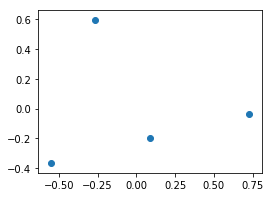

In [115]:
#%matplotlib_inline

# generate a list of (filename, funcname, class, doc)
ds = []
for i in range(len(dataset)):
    doc = dataset[i].code_feats['document']
    function_name = dataset[i].filename
    the_class = dataset[i].y
    ds.append((function_name, the_class, doc))
    
x_train, y_train, x_test, y_test = preprocess_docs(ds) # preprocessing for code
    
embedding_print(x_train, y_train, 'tfidf')



In [ ]:

print('Using Count Vectorizer------')
model_pipeline1 = pipeline(x_train, y_train, mode='count')
print('Using TF Vectorizer------')
model_pipeline2 = pipeline(x_train, y_train,  mode='tf')
print('Using TF-IDF Vectorizer------')
model_pipeline3 = pipeline(x_train, y_train, mode='tfidf')

print("ANd now the accuracy on the test dataset")
preds1=model_pipeline1.predict(x_test)
preds2=model_pipeline2.predict(x_test)
preds3=model_pipeline3.predict(x_test)

accuracy_score(0,preds1)
accuracy_score(1,preds2)
accuracy_score(0,preds3)


##  Topological graph features on the complete dataset

In [51]:
import time
start = time.time()

dataset = FunctionsDataset(root='./tmp/big_noisy_dataset_topological')
print(len(dataset))
print(dataset.num_classes)
print(dataset.num_features)

end = time.time()
print(end - start)

processed_path tmp/big_noisy_dataset_topological/processed
Processing...
 FunctionsDataset: process()
processed_path tmp/big_noisy_dataset_topological/processed
self.processed_paths []
self.root tmp/big_noisy_dataset_topological
self.raw_dir tmp/big_noisy_dataset_topological/raw
self.raw_file_names ['graphs01']
self.raw_paths ['tmp/big_noisy_dataset_topological/raw/graphs01']



KeyboardInterrupt: 

This dataset processing started at 20h14, and ended at  ...

In [50]:
print(len(dataset.problematic_files))
pprint(dataset.problematic_files)


0
[]



##  Training a toy model

### IMPORTANT: train and test dataset should be written to disk 

* improved speed when resuming trainings
* take the generated list of files
* using softlinks for less disk space usage?

In [6]:
%load_ext autoreload
%autoreload 2

import os,sys,inspect
currentdir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parentdir = os.path.dirname(currentdir)
sys.path.insert(0,parentdir+'/graph_classification') 

from TFM_graph_classification import *
from TFM_graph_classification_models import *
from TFM_function_renaming_dataset_creation import *

global device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

%load_ext autoreload
%autoreload 2

import importlib
import time
import pickle
import traceback
import random
import os
import re
import sys
import json
from pprint import pprint
import numpy as np
from numpy.random import choice
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

import torch
from torch_geometric.data import Dataset
from torch_geometric.data import Data
from torch_geometric.data import DataLoader

from TFM_function_renaming_dataset_creation import *
from TFM_function_renaming_dataset_creation import FunctionsDataset



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
resultsdict = {'best_models_list':[], 'models':{} , 'best_models':{}, 'autoincrement': 0 }

#### Saving training and testing dataset on disk

In [9]:
k=3
for i in range(1):
    proportion = 0.8 if i < 3 else 0.7
    train_dataset, test_dataset = prepare_dataset(dataset, 
                                                   
                                                  prop=proportion, 
                                                  dataset_type="balanced", 
                                                  print_debug=True,
                                                  randomize=True,
                                                  desired_size=2000)

    save_partial_dataset_symlinks(train_dataset, new_name='mid_train_{:02d}'.format(i))
    save_partial_dataset_symlinks(test_dataset, new_name='mid_test_{:02d}'.format(i))


 n: 205775  k folds= 3
Datasets balancing: 
{0: 69579, 1: 49964, 2: 86232}
{0: 2000, 1: 2000, 2: 2000}
{0: 500, 1: 500, 2: 500}



In [10]:
k=3
for i in range(1):
    proportion = 0.8 if i < 3 else 0.7
    train_dataset, test_dataset = prepare_dataset(dataset,  
                                                  prop=proportion, 
                                                  dataset_type="balanced", 
                                                  print_debug=True,
                                                  randomize=True,
                                                  desired_size=5000)

    save_partial_dataset_symlinks(train_dataset, new_name='mid2_train_{:02d}'.format(i))
    save_partial_dataset_symlinks(test_dataset, new_name='mid2_test_{:02d}'.format(i))


 n: 205775  k folds= 3
Datasets balancing: 
{0: 69579, 1: 49964, 2: 86232}
{0: 5000, 1: 5000, 2: 5000}
{0: 1250, 1: 1250, 2: 1250}



In [11]:
k=3
train_dataset = FunctionsDataset(root='./tmp/mid_train_00')
print(len(train_dataset))
print(train_dataset.num_classes)
print(train_dataset.num_features)

test_dataset = FunctionsDataset(root='./tmp/mid_test_00')
print(len(test_dataset))
print(test_dataset.num_classes)
print(test_dataset.num_features)

processed_path tmp/mid_train_00/processed
 end of __init__()
6000
3
4
processed_path tmp/mid_test_00/processed
 end of __init__()
1500
3
4


In [12]:
model_list21 = hpsearch(None, {
    'd1': [50],
    'd2': [125],
    'epochs': [200,300],
    'model': [GGNN1],
    'learning_rate': [0.01],
    'weight_decay':[5e-4],
    'num_layers':[6],
    'aggr_type': ['mean'],
    'batch_size': [32]
})
modelsdict1 = modelSelection(model_list21,k, train_dataset, balanced=True)
reportModelSelectionResult(modelsdict1,resultsdict)

<class 'TFM_graph_classification.GatedGraphConv'> True
 trained model:  GGNN1 {'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_type': 'mean'}  epochs: 200  val loss= 51515.13591304173  val accuracy= 0.5714285714285714  val microF1= 0.4192525859192526  val macroF1= 0.3702900010957788  time= 1449.6 s
<class 'TFM_graph_classification.GatedGraphConv'> True
 trained model:  GGNN1 {'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_type': 'mean'}  epochs: 300  val loss= 0.032914500683546066  val accuracy= 0.38095238095238093  val microF1= 0.39923256589923256  val macroF1= 0.2904680617561361  time= 2251.03 s
<class 'TFM_graph_classification.GatedGraphConv'> True
<class 'TFM_graph_classification.GatedGraphConv'> True
<class 'TFM_graph_classification.GatedGraphConv'> True
<class 'TFM_graph_classification.GatedGraphConv'> True
total training time  6159.356543064117

 selected model from loss:  0_GGNN1 {'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_type': 'mean'}  epochs: 300 0.032914500683546066 0.3809523809

,best_model_loss,best_model_acc,best_model_microF1,best_model_macroF1
accuracy,0.285714,0.571429,0.571429,0.571429
batch_size,32,32,32,32
cv_val_accuracy,0.380952,0.571429,0.571429,0.571429
cv_val_loss,0.0329145,51515.1,51515.1,51515.1
cv_val_macroF1,0.290468,0.37029,0.37029,0.37029
cv_val_microF1,0.399233,0.419253,0.419253,0.419253
epochs,300,200,200,200
filename,0_GGNN1__d1-50_d2-125_num_layers-6_aggr_type-m...,3_GGNN1__d1-50_d2-125_num_layers-6_aggr_type-m...,3_GGNN1__d1-50_d2-125_num_layers-6_aggr_type-m...,3_GGNN1__d1-50_d2-125_num_layers-6_aggr_type-m...
final_model,"GGNN1(\n (ggnn): GatedGraphConv(50, num_layer...","GGNN1(\n (ggnn): GatedGraphConv(50, num_layer...","GGNN1(\n (ggnn): GatedGraphConv(50, num_layer...","GGNN1(\n (ggnn): GatedGraphConv(50, num_layer..."
kwargs,"{'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_t...","{'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_t...","{'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_t...","{'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_t..."


In [15]:
model_list21 = hpsearch(None, {
    'd1': [30],
    'd2': [10],
    'epochs': [400],
    'model': [GGNN2],
    'learning_rate': [0.01],
    'weight_decay':[5e-4],
    'num_layers':[6],
    'aggr_type': ['mean','add'],
    'batch_size': [32]
})
modelsdict1 = modelSelection(model_list21,k, train_dataset, balanced=True)
reportModelSelectionResult(modelsdict1,resultsdict)

<class 'TFM_graph_classification.GatedGraphConv'> True
 trained model:  GGNN2 {'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_type': 'mean'}  epochs: 400  val loss= 16654.80886770785  val accuracy= 0.4523809523809524  val microF1= 0.4531197864531198  val macroF1= 0.43513584478916134  time= 2671.22 s
<class 'TFM_graph_classification.GatedGraphConv'> True
 trained model:  GGNN2 {'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_type': 'add'}  epochs: 400  val loss= 24973.105143229168  val accuracy= 0.2619047619047619  val microF1= 0.3328328328328329  val macroF1= 0.23800197925849184  time= 2669.69 s
<class 'TFM_graph_classification.GatedGraphConv'> True
<class 'TFM_graph_classification.GatedGraphConv'> True
<class 'TFM_graph_classification.GatedGraphConv'> True
<class 'TFM_graph_classification.GatedGraphConv'> True
total training time  9126.963899612427

 selected model from loss:  7_GGNN2 {'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_type': 'mean'}  epochs: 400 16654.80886770785 0.4523809523809524 0

,best_model_loss,best_model_acc,best_model_microF1,best_model_macroF1
accuracy,0.5,0.5,0.5,0.5
batch_size,32,32,32,32
cv_val_accuracy,0.452381,0.452381,0.452381,0.452381
cv_val_loss,16654.8,16654.8,16654.8,16654.8
cv_val_macroF1,0.435136,0.435136,0.435136,0.435136
cv_val_microF1,0.45312,0.45312,0.45312,0.45312
epochs,400,400,400,400
filename,7_GGNN2__d1-30_d2-10_num_layers-6_aggr_type-me...,7_GGNN2__d1-30_d2-10_num_layers-6_aggr_type-me...,7_GGNN2__d1-30_d2-10_num_layers-6_aggr_type-me...,7_GGNN2__d1-30_d2-10_num_layers-6_aggr_type-me...
final_model,"GGNN2(\n (ggnn): GatedGraphConv(30, num_layer...","GGNN2(\n (ggnn): GatedGraphConv(30, num_layer...","GGNN2(\n (ggnn): GatedGraphConv(30, num_layer...","GGNN2(\n (ggnn): GatedGraphConv(30, num_layer..."
kwargs,"{'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_ty...","{'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_ty...","{'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_ty...","{'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_ty..."


In [16]:
k=3
train_dataset = FunctionsDataset(root='./tmp/mid2_train_00')
print(len(train_dataset))
print(train_dataset.num_classes)
print(train_dataset.num_features)

test_dataset = FunctionsDataset(root='./tmp/mid2_test_00')
print(len(test_dataset))
print(test_dataset.num_classes)
print(test_dataset.num_features)

processed_path tmp/mid2_train_00/processed
 end of __init__()
15000
3
4
processed_path tmp/mid2_test_00/processed
 end of __init__()
3750
3
4


In [17]:
model_list21 = hpsearch(None, {
    'd1': [50],
    'd2': [125],
    'epochs': [200,300],
    'model': [GGNN1],
    'learning_rate': [0.01],
    'weight_decay':[5e-4],
    'num_layers':[6],
    'aggr_type': ['mean'],
    'batch_size': [32]
})
modelsdict1 = modelSelection(model_list21,k, train_dataset, balanced=True)
reportModelSelectionResult(modelsdict1,resultsdict)

<class 'TFM_graph_classification.GatedGraphConv'> True
Problem training model GGNN1
 trained model:  GGNN1 {'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_type': 'mean'}  epochs: 200  val loss= 0.0  val accuracy= 0.0  val microF1= 0.0  val macroF1= 0.0  time= 7.27 s
<class 'TFM_graph_classification.GatedGraphConv'> True


Traceback (most recent call last):
  File "/media/disk/home/pau/Projectes/GNN-MThesis/src/graph_classification/TFM_graph_classification.py", line 1259, in modelSelection
    val_loss_model(model, loader_val, optimizer, val_history)
  File "/media/disk/home/pau/Projectes/GNN-MThesis/src/graph_classification/TFM_graph_classification.py", line 907, in val_loss_model
    return val_loss_model_GGNN(model, loader, optimizer, val_history)
  File "/media/disk/home/pau/Projectes/GNN-MThesis/src/graph_classification/TFM_graph_classification.py", line 809, in val_loss_model_GGNN
    pred = model(data)
  File "/home/pau/.pyenv/versions/3.6.7/envs/gnn-pytorch/lib/python3.6/site-packages/torch/nn/modules/module.py", line 489, in __call__
    result = self.forward(*input, **kwargs)
  File "/media/disk/home/pau/Projectes/GNN-MThesis/src/graph_classification/TFM_graph_classification_models.py", line 30, in forward
    x = self.ggnn(x, edge_index)
  File "/home/pau/.pyenv/versions/3.6.7/envs/gnn-pytorch

Problem training model GGNN1
 trained model:  GGNN1 {'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_type': 'mean'}  epochs: 300  val loss= 0.0  val accuracy= 0.0  val microF1= 0.0  val macroF1= 0.0  time= 6.18 s
<class 'TFM_graph_classification.GatedGraphConv'> True


Traceback (most recent call last):
  File "/media/disk/home/pau/Projectes/GNN-MThesis/src/graph_classification/TFM_graph_classification.py", line 1259, in modelSelection
    val_loss_model(model, loader_val, optimizer, val_history)
  File "/media/disk/home/pau/Projectes/GNN-MThesis/src/graph_classification/TFM_graph_classification.py", line 907, in val_loss_model
    return val_loss_model_GGNN(model, loader, optimizer, val_history)
  File "/media/disk/home/pau/Projectes/GNN-MThesis/src/graph_classification/TFM_graph_classification.py", line 809, in val_loss_model_GGNN
    pred = model(data)
  File "/home/pau/.pyenv/versions/3.6.7/envs/gnn-pytorch/lib/python3.6/site-packages/torch/nn/modules/module.py", line 489, in __call__
    result = self.forward(*input, **kwargs)
  File "/media/disk/home/pau/Projectes/GNN-MThesis/src/graph_classification/TFM_graph_classification_models.py", line 30, in forward
    x = self.ggnn(x, edge_index)
  File "/home/pau/.pyenv/versions/3.6.7/envs/gnn-pytorch

<class 'TFM_graph_classification.GatedGraphConv'> True
<class 'TFM_graph_classification.GatedGraphConv'> True
<class 'TFM_graph_classification.GatedGraphConv'> True
total training time  5551.822961330414

 selected model from loss:  11_GGNN1 {'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_type': 'mean'}  epochs: 200 0.0 0.0 0.0 0.0
 selected model from accuracy:  11_GGNN1 {'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_type': 'mean'}  epochs: 200 0.0 0.0 0.0 0.0
 selected model from microF1:  11_GGNN1 {'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_type': 'mean'}  epochs: 200 0.0 0.0 0.0 0.0
 selected model from macroF1:  11_GGNN1 {'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_type': 'mean'}  epochs: 200 0.0 0.0 0.0 0.0


,best_model_loss,best_model_acc,best_model_microF1,best_model_macroF1
batch_size,32,32,32,32
cv_val_accuracy,0,0,0,0
cv_val_loss,0,0,0,0
cv_val_macroF1,0,0,0,0
cv_val_microF1,0,0,0,0
epochs,200,200,200,200
filename,11_GGNN1__d1-50_d2-125_num_layers-6_aggr_type-...,11_GGNN1__d1-50_d2-125_num_layers-6_aggr_type-...,11_GGNN1__d1-50_d2-125_num_layers-6_aggr_type-...,11_GGNN1__d1-50_d2-125_num_layers-6_aggr_type-...
final_model,"GGNN1(\n (ggnn): GatedGraphConv(50, num_layer...","GGNN1(\n (ggnn): GatedGraphConv(50, num_layer...","GGNN1(\n (ggnn): GatedGraphConv(50, num_layer...","GGNN1(\n (ggnn): GatedGraphConv(50, num_layer..."
kwargs,"{'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_t...","{'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_t...","{'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_t...","{'d1': 50, 'd2': 125, 'num_layers': 6, 'aggr_t..."
learning_rate,0.01,0.01,0.01,0.01


In [18]:
model_list21 = hpsearch(None, {
    'd1': [30],
    'd2': [10],
    'epochs': [400],
    'model': [GGNN2],
    'learning_rate': [0.01],
    'weight_decay':[5e-4],
    'num_layers':[6],
    'aggr_type': ['mean','add'],
    'batch_size': [32]
})
modelsdict1 = modelSelection(model_list21,k, train_dataset, balanced=True)
reportModelSelectionResult(modelsdict1,resultsdict)

<class 'TFM_graph_classification.GatedGraphConv'> True
 trained model:  GGNN2 {'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_type': 'mean'}  epochs: 400  val loss= 4453.625204070161  val accuracy= 0.611111111111111  val microF1= 0.3840869681205816  val macroF1= 0.32825222997919196  time= 6821.33 s
<class 'TFM_graph_classification.GatedGraphConv'> True
 trained model:  GGNN2 {'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_type': 'add'}  epochs: 400  val loss= 22763.484711480018  val accuracy= 0.38888888888888884  val microF1= 0.43644124316393224  val macroF1= 0.42947309419721313  time= 6869.43 s
<class 'TFM_graph_classification.GatedGraphConv'> True
<class 'TFM_graph_classification.GatedGraphConv'> True
<class 'TFM_graph_classification.GatedGraphConv'> True
<class 'TFM_graph_classification.GatedGraphConv'> True
total training time  23113.26659321785

 selected model from loss:  13_GGNN2 {'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_type': 'mean'}  epochs: 400 4453.625204070161 0.611111111111111 

,best_model_loss,best_model_acc,best_model_microF1,best_model_macroF1
accuracy,0.666667,0.666667,0.333333,0.333333
batch_size,32,32,32,32
cv_val_accuracy,0.611111,0.611111,0.388889,0.388889
cv_val_loss,4453.63,4453.63,22763.5,22763.5
cv_val_macroF1,0.328252,0.328252,0.429473,0.429473
cv_val_microF1,0.384087,0.384087,0.436441,0.436441
epochs,400,400,400,400
filename,13_GGNN2__d1-30_d2-10_num_layers-6_aggr_type-m...,13_GGNN2__d1-30_d2-10_num_layers-6_aggr_type-m...,15_GGNN2__d1-30_d2-10_num_layers-6_aggr_type-a...,15_GGNN2__d1-30_d2-10_num_layers-6_aggr_type-a...
final_model,"GGNN2(\n (ggnn): GatedGraphConv(30, num_layer...","GGNN2(\n (ggnn): GatedGraphConv(30, num_layer...","GGNN2(\n (ggnn): GatedGraphConv(30, num_layer...","GGNN2(\n (ggnn): GatedGraphConv(30, num_layer..."
kwargs,"{'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_ty...","{'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_ty...","{'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_ty...","{'d1': 30, 'd2': 10, 'num_layers': 6, 'aggr_ty..."


In [19]:
test_multiple_models(resultsdict,test_dataset)
report_all_test(resultsdict)

11_GGNN1
11_GGNN1__d1-50_d2-125_num_layers-6_aggr_type-mean_200_0.01_0.0005_32_date2019-07-10_11-50-22
11_GGNN1
11_GGNN1__d1-50_d2-125_num_layers-6_aggr_type-mean_200_0.01_0.0005_32_date2019-07-10_11-50-22
11_GGNN1
11_GGNN1__d1-50_d2-125_num_layers-6_aggr_type-mean_200_0.01_0.0005_32_date2019-07-10_11-50-22
11_GGNN1
11_GGNN1__d1-50_d2-125_num_layers-6_aggr_type-mean_200_0.01_0.0005_32_date2019-07-10_11-50-22
0_GGNN1
0_GGNN1__d1-50_d2-125_num_layers-6_aggr_type-mean_300_0.01_0.0005_32_date2019-07-10_06-06-51
15_GGNN2
15_GGNN2__d1-30_d2-10_num_layers-6_aggr_type-add_400_0.01_0.0005_32_date2019-07-10_18-15-35
15_GGNN2
15_GGNN2__d1-30_d2-10_num_layers-6_aggr_type-add_400_0.01_0.0005_32_date2019-07-10_18-15-35
7_GGNN2
7_GGNN2__d1-30_d2-10_num_layers-6_aggr_type-mean_400_0.01_0.0005_32_date2019-07-10_10-17-50
7_GGNN2
7_GGNN2__d1-30_d2-10_num_layers-6_aggr_type-mean_400_0.01_0.0005_32_date2019-07-10_10-17-50
7_GGNN2
7_GGNN2__d1-30_d2-10_num_layers-6_aggr_type-mean_400_0.01_0.0005_32_date2019-

,accuracy,macroF1,microF1,name
5,0.3307,0.1943,0.3307,13_GGNN2
4,0.3317,0.1980,0.3317,7_GGNN2
2,0.3333,0.1667,0.3333,11_GGNN1
3,0.4395,0.4459,0.4395,15_GGNN2
0,0.4523,0.4566,0.4523,0_GGNN1
1,0.4664,0.4710,0.4664,3_GGNN1
